## Import all the necessary libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

from sklearn.cluster import KMeans
import itertools

from sklearn.decomposition import PCA
from sklearn.svm import SVC

## PART - A 

- **DOMAIN:** Automobile
- **CONTEXT:** The data concerns city-cycle fuel consumption in miles per gallon to be predicted in terms of 3 multivalued discrete and 5 continuous attributes.
- **DATA DESCRIPTION:**
    -  cylinders: multi-valued discrete. 
    - acceleration: continuous.
    - displacement: continuous. 
    - model year: multi-valued discrete.
    - horsepower: continuous. 
    - origin: multi-valued discrete.
    - weight: continuous. 
    - car name: string (unique for each instance).
    - mpg: continuous. 
    
- **PROJECT OBJECTIVE:** To understand K-means Clustering by applying on the Car Dataset to segment the cars into various categories.

### 1. Data Understanding & Exploration:

### A. Read 'Car name.csv' as a DataFrame and assign it to a variable.

In [2]:
df1= pd.read_csv('Car name.csv')

In [3]:
# Print the first five rows of the dataset
df1.head()

,car_name
0,chevrolet chevelle malibu
1,buick skylark 320
2,plymouth satellite
3,amc rebel sst
4,ford torino


In [4]:
# Print the last five rows of the dataset
df1.tail()

,car_name
393,ford mustang gl
394,vw pickup
395,dodge rampage
396,ford ranger
397,chevy s-10


In [5]:
# Shape and column of df1
print("Shape of df1:")
print(df1.shape)
print("Columns of df1:")
print(df1.columns)
print('\n')
row, column = df1.shape
print('The dataset contains', row, 'rows and', column, 'column')

Shape of df1:
(398, 1)
Columns of df1:
Index(['car_name'], dtype='object')


The dataset contains 398 rows and 1 column


### B. Read 'Car-Attributes.json' as a DataFrame and assign it to a variable.

In [6]:
df2 = pd.read_json('Car-Attributes.json')   

In [7]:
# Print the first five rows of the dataset
df2.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


In [8]:
# Print the last five rows of the dataset
df2.tail()

,mpg,cyl,disp,hp,wt,acc,yr,origin
393,27.0,4,140.0,86,2790,15.6,82,1
394,44.0,4,97.0,52,2130,24.6,82,2
395,32.0,4,135.0,84,2295,11.6,82,1
396,28.0,4,120.0,79,2625,18.6,82,1
397,31.0,4,119.0,82,2720,19.4,82,1


In [9]:
# Shape and column of df2
print("Shape of df2:")
print(df2.shape)
print("Columns of df2:")
print(df2.columns)
print('\n')
row, column = df2.shape
print('The dataset contains', row, 'rows and', column, 'columns')

Shape of df2:
(398, 8)
Columns of df2:
Index(['mpg', 'cyl', 'disp', 'hp', 'wt', 'acc', 'yr', 'origin'], dtype='object')


The dataset contains 398 rows and 8 columns


### C. Merge both the DataFrames together to form a single DataFrame.

In [10]:
merged_df = pd.merge(df1, df2, left_index=True, right_index=True)

In [11]:
# Print the first five rows of the dataset
merged_df.head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


In [12]:
# Print the last five rows of the dataset
merged_df.tail()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
393,ford mustang gl,27.0,4,140.0,86,2790,15.6,82,1
394,vw pickup,44.0,4,97.0,52,2130,24.6,82,2
395,dodge rampage,32.0,4,135.0,84,2295,11.6,82,1
396,ford ranger,28.0,4,120.0,79,2625,18.6,82,1
397,chevy s-10,31.0,4,119.0,82,2720,19.4,82,1


In [13]:
# Shape and column of merged_df
print("Shape of merged_df:")
print(merged_df.shape)
print("Columns of merged_df:")
print(merged_df.columns)
print('\n')
row, column = merged_df.shape
print('The dataset contains', row, 'rows and', column, 'columns')

Shape of merged_df:
(398, 9)
Columns of merged_df:
Index(['car_name', 'mpg', 'cyl', 'disp', 'hp', 'wt', 'acc', 'yr', 'origin'], dtype='object')


The dataset contains 398 rows and 9 columns


In [14]:
# Checking the data types of the columns for the dataset
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    object 
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


- There are 398 rows and 8 columns present in the dataset.
- We need to change the datatype of 'hp' from categorical datatype to numerical datatype.

### D. Print 5 point summary of the numerical features and share insights.

In [15]:
merged_df.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.514573,7.815984,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.454774,1.701004,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.425879,104.269838,68.0,104.250,148.5,262.000,455.0
wt,398.0,2970.424623,846.841774,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568090,2.757689,8.0,13.825,15.5,17.175,24.8
yr,398.0,76.010050,3.697627,70.0,73.000,76.0,79.000,82.0
origin,398.0,1.572864,0.802055,1.0,1.000,1.0,2.000,3.0


- **mpg :** The dataset consists of 398 observations. The average MPG is approximately 23.51, with a standard deviation of 7.82. The minimum MPG recorded is 9.0, while the maximum is 46.6. The median (50th percentile) value is 23.0.
- **cyl :** The average number of cylinders is approximately 5.45, with a standard deviation of 1.70. The dataset includes cars with a minimum of 3 cylinders and a maximum of 8 cylinders. The majority of cars in the dataset have either 4 or 8 cylinders, as indicated by the 25th (Q1) and 75th (Q3) percentiles.
- **disp :** The mean engine displacement is approximately 193.43, with a standard deviation of 104.27. The engine displacements range from a minimum of 68.0 cubic inches to a maximum of 455.0 cubic inches. The median displacement value is 148.5, suggesting that there is a significant number of cars with smaller engine sizes.
- **wt :** The average vehicle weight is approximately 2970.42 pounds, with a standard deviation of 846.84 pounds. The weights range from a minimum of 1613.0 pounds to a maximum of 5140.0 pounds. The median weight is 2803.5 pounds.
- **acc :** The mean acceleration is approximately 15.57 seconds, with a standard deviation of 2.76 seconds. The acceleration values range from a minimum of 8.0 seconds to a maximum of 24.8 seconds. The median acceleration is 15.5 seconds.
- **yr :** The dataset covers a range of model years from 70 to 82. The average model year is approximately 76.01, with a standard deviation of 3.70. The median year is 76.0.
- **origin:** The dataset contains 398 entries with a mean origin value of 1.572864. The values range from a minimum of 1.0 to a maximum of 3.0. The majority of the vehicles in the dataset have an origin value of 1.0 (25th and 50th percentile), and the 75th percentile is 2.0. The standard deviation is 0.802055, indicating some variability in the origin values.


### 2. Data Preparation & Analysis:

### A. Check and print feature-wise percentage of missing values present in the data and impute with the best suitable approach.

In [16]:
# Check for missing values
missing_percentage = merged_df.isnull().mean() * 100

# Print the feature-wise percentage of missing values
print(missing_percentage)

car_name    0.0
mpg         0.0
cyl         0.0
disp        0.0
hp          0.0
wt          0.0
acc         0.0
yr          0.0
origin      0.0
dtype: float64


- There are no missing values present in the data set.

### B. Check for duplicate values in the data and impute with the best suitable approach.

In [17]:
# Check for duplicate rows
duplicate_rows = merged_df.duplicated()

# Count the number of duplicate rows
num_duplicates = duplicate_rows.sum()

# Determine if the dataset has any duplicate rows
if num_duplicates > 0:
    print("The dataset has duplicate rows.")
else:
    print("The dataset does not have any duplicate rows.")

The dataset does not have any duplicate rows.


### C. Plot a pairplot for all features.

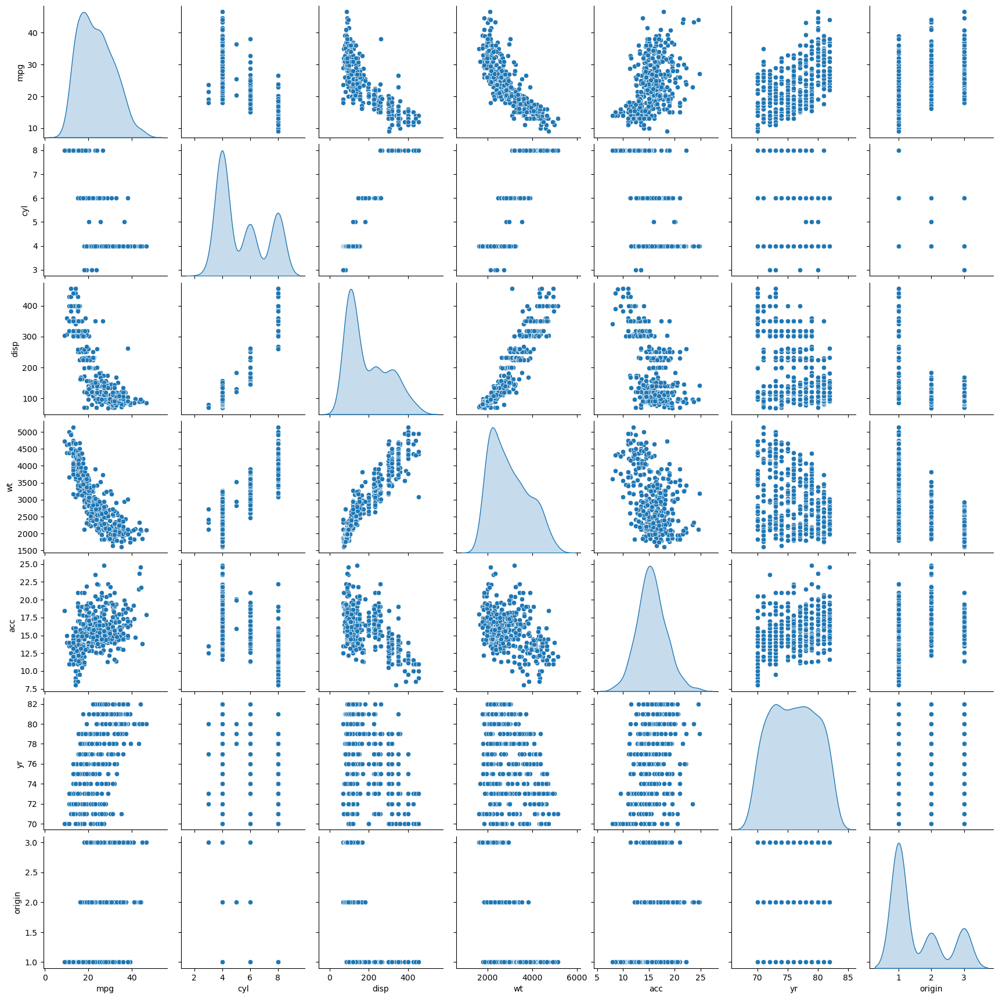

In [18]:
sns.pairplot(merged_df, diag_kind='kde')

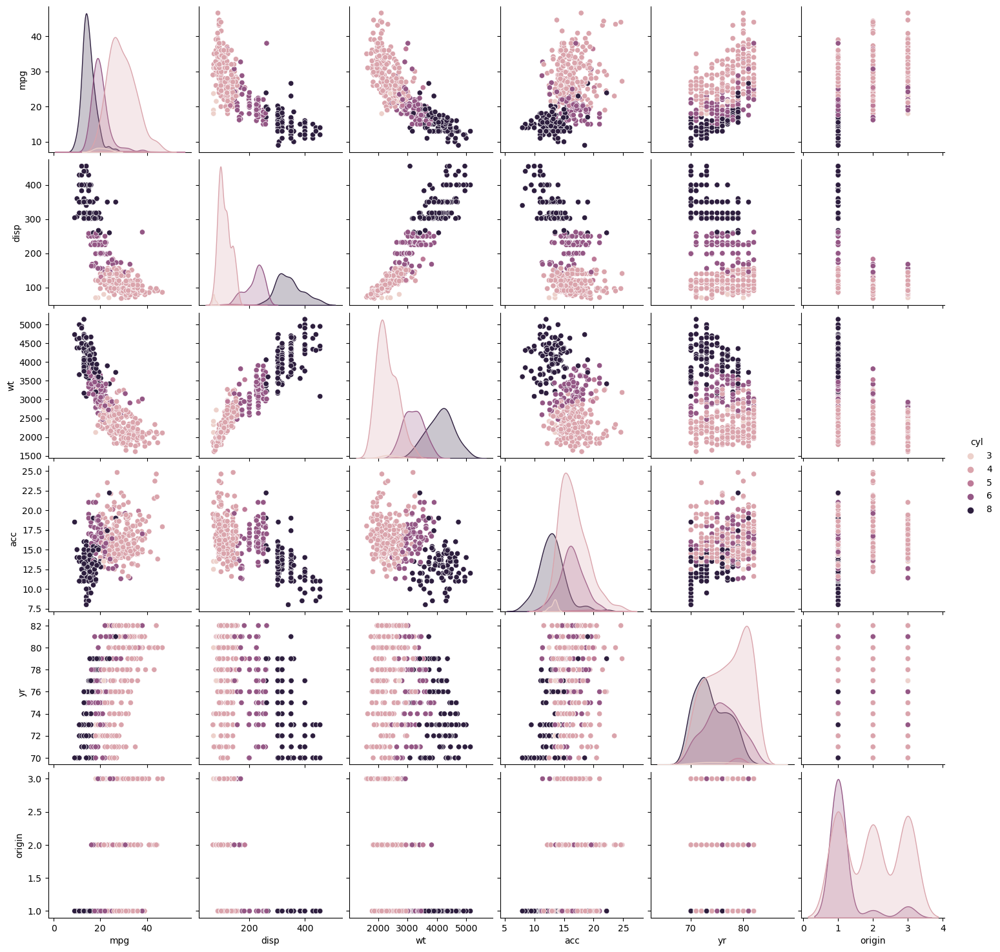

In [19]:
sns.pairplot(merged_df, diag_kind='kde', hue='cyl')

In [20]:
# Calculate the value counts and percentages for 'origin'
class_counts = merged_df['origin'].value_counts()
class_percentages = class_counts / len(merged_df) * 100

In [21]:
class_percentages

1    62.562814
3    19.849246
2    17.587940
Name: origin, dtype: float64

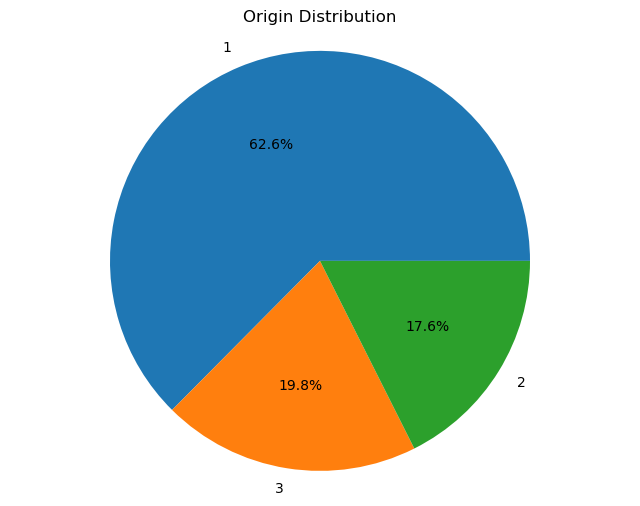

In [22]:
# Create a pie chart
plt.figure(figsize=(8, 6))
plt.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%')
plt.title('Origin Distribution')
plt.axis('equal')
plt.show()

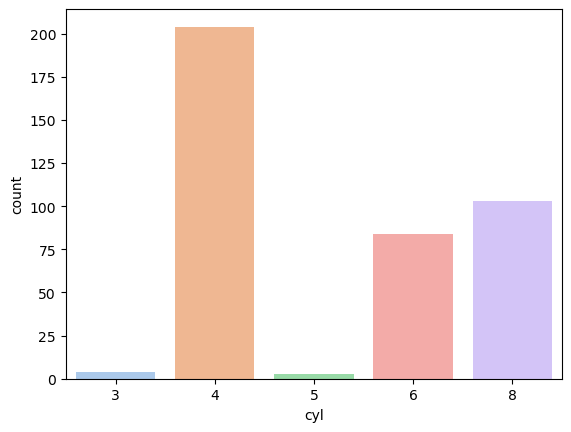

In [23]:
# Use the 'pastel' color palette
color_palette = 'pastel'

# Plot the countplot with the specified color palette
sns.countplot(data=merged_df, x='cyl', palette=color_palette)

# Display the plot
plt.show()

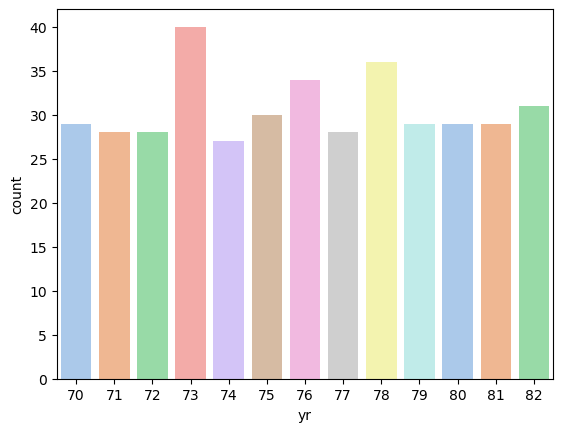

In [24]:
# Use the 'pastel' color palette
color_palette = 'pastel'

# Plot the countplot with the specified color palette
sns.countplot(data=merged_df, x='yr', palette=color_palette)

# Display the plot
plt.show()

### D. Visualize a scatterplot for 'wt' and 'disp'. Datapoints should be distinguishable by 'cyl'.

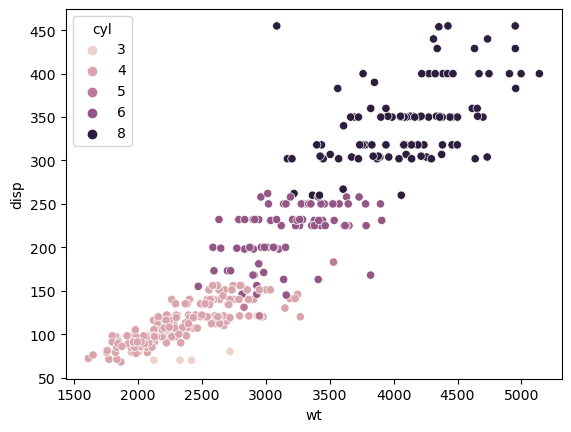

In [25]:
# Plot the scatterplot
sns.scatterplot(data=merged_df, x='wt', y='disp', hue='cyl')

# Show the plot
plt.show()

### E. Share insights for 2.D.

The scatter plot shows that

- Weight('wt') and Displacement('disp') appear to be linearly dependent and proprotional.
- Cars with a higher number of Cylinders('cyl') have a higher Weight('wt)' and Displacement('disp').
- Cars with the same number of Cylinders ('cyl') and engine Displacement ('disp') can have different Weights ('wt') as well.

### F. Visualize a scatterplot for 'wt' and 'mpg'. Datapoints should be distinguishable by 'cyl'.

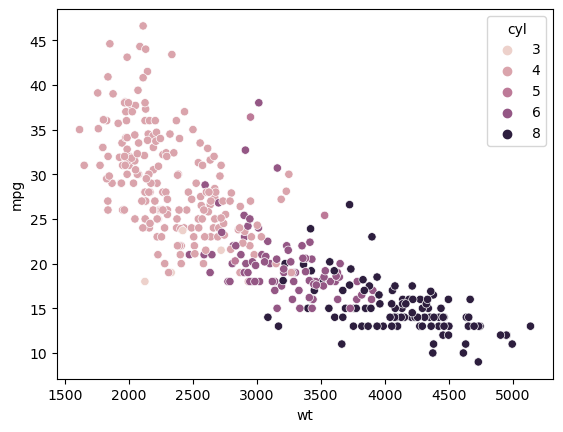

In [26]:
# Plot the scatterplot
sns.scatterplot(data=merged_df, x='wt', y='mpg', hue='cyl')

# Show the plot
plt.show() 

### G. Share insights for 2.F.

The scatter plot shows that:
- Miles per gallon ('mpg'), is inverselyproportional to its weight ('wt'). Cars with higher mpg tend to have lower weight, and cars with lower mpg tend to have higher weight('wt').
- The number of cylinders('cyl') in a car affects its mpg. Cars with fewer cylinders('cyl') have higher mpg, while cars with more cylinders('cyl') have lower mpg.


### H. Check for unexpected values in all the features and datapoints with such values.

In [27]:
# check unique values of each column
for column in merged_df.columns:
    unique_values_count = merged_df[column].nunique()
    unique_values = merged_df[column].unique()
    print(f"Unique values count for {column}: {unique_values_count}")
    print(f"Unique values for {column}:\n{unique_values}\n")

Unique values count for car_name: 305
Unique values for car_name:
['chevrolet chevelle malibu' 'buick skylark 320' 'plymouth satellite'
 'amc rebel sst' 'ford torino' 'ford galaxie 500' 'chevrolet impala'
 'plymouth fury iii' 'pontiac catalina' 'amc ambassador dpl'
 'dodge challenger se' "plymouth 'cuda 340" 'chevrolet monte carlo'
 'buick estate wagon (sw)' 'toyota corona mark ii' 'plymouth duster'
 'amc hornet' 'ford maverick' 'datsun pl510'
 'volkswagen 1131 deluxe sedan' 'peugeot 504' 'audi 100 ls' 'saab 99e'
 'bmw 2002' 'amc gremlin' 'ford f250' 'chevy c20' 'dodge d200' 'hi 1200d'
 'chevrolet vega 2300' 'toyota corona' 'ford pinto'
 'plymouth satellite custom' 'ford torino 500' 'amc matador'
 'pontiac catalina brougham' 'dodge monaco (sw)'
 'ford country squire (sw)' 'pontiac safari (sw)'
 'amc hornet sportabout (sw)' 'chevrolet vega (sw)' 'pontiac firebird'
 'ford mustang' 'mercury capri 2000' 'opel 1900' 'peugeot 304' 'fiat 124b'
 'toyota corolla 1200' 'datsun 1200' 'volkswagen 

We can observe that there is unexpected value '?' present in the 'hp' column.

In [28]:
# isdigit()? on 'hp' 
hpIsDigit = pd.DataFrame(merged_df.hp.str.isdigit()) 

#print isDigit = False!
merged_df[hpIsDigit['hp'] == False] 

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
32,ford pinto,25.0,4,98.0,?,2046,19.0,71,1
126,ford maverick,21.0,6,200.0,?,2875,17.0,74,1
330,renault lecar deluxe,40.9,4,85.0,?,1835,17.3,80,2
336,ford mustang cobra,23.6,4,140.0,?,2905,14.3,80,1
354,renault 18i,34.5,4,100.0,?,2320,15.8,81,2
374,amc concord dl,23.0,4,151.0,?,3035,20.5,82,1


In [29]:
# Replace '?' with NaN in 'hp' column
merged_df['hp'] = merged_df['hp'].replace('?', np.nan)

In [30]:
# Re- checking if there is unexpected values present in 'hp' column 
merged_df['hp'].unique()

array([130., 165., 150., 140., 198., 220., 215., 225., 190., 170., 160.,
        95.,  97.,  85.,  88.,  46.,  87.,  90., 113., 200., 210., 193.,
        nan, 100., 105., 175., 153., 180., 110.,  72.,  86.,  70.,  76.,
        65.,  69.,  60.,  80.,  54., 208., 155., 112.,  92., 145., 137.,
       158., 167.,  94., 107., 230.,  49.,  75.,  91., 122.,  67.,  83.,
        78.,  52.,  61.,  93., 148., 129.,  96.,  71.,  98., 115.,  53.,
        81.,  79., 120., 152., 102., 108.,  68.,  58., 149.,  89.,  63.,
        48.,  66., 139., 103., 125., 133., 138., 135., 142.,  77.,  62.,
       132.,  84.,  64.,  74., 116.,  82.])

In [31]:
# let's check the data type of columns again
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        392 non-null    float64
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(4), int64(4), object(1)
memory usage: 28.1+ KB


In [32]:
# Checking if there is any missing values
merged_df.isnull().sum()

car_name    0
mpg         0
cyl         0
disp        0
hp          6
wt          0
acc         0
yr          0
origin      0
dtype: int64

- There are 6 missing values present in the 'hp' column.

In [33]:
# Droping rows with missing values in the 'hp' column
merged_df.dropna(subset=['hp'], inplace=True)

In [34]:
# Re-checking the missing values
merged_df.isnull().sum()

car_name    0
mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
yr          0
origin      0
dtype: int64

In [35]:
# Re-Print 5 point summary of the numerical features and share insights
merged_df.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,392.0,23.445918,7.805007,9.0,17.000,22.75,29.000,46.6
cyl,392.0,5.471939,1.705783,3.0,4.000,4.00,8.000,8.0
disp,392.0,194.411990,104.644004,68.0,105.000,151.00,275.750,455.0
hp,392.0,104.469388,38.491160,46.0,75.000,93.50,126.000,230.0
wt,392.0,2977.584184,849.402560,1613.0,2225.250,2803.50,3614.750,5140.0
acc,392.0,15.541327,2.758864,8.0,13.775,15.50,17.025,24.8
yr,392.0,75.979592,3.683737,70.0,73.000,76.00,79.000,82.0
origin,392.0,1.576531,0.805518,1.0,1.000,1.00,2.000,3.0


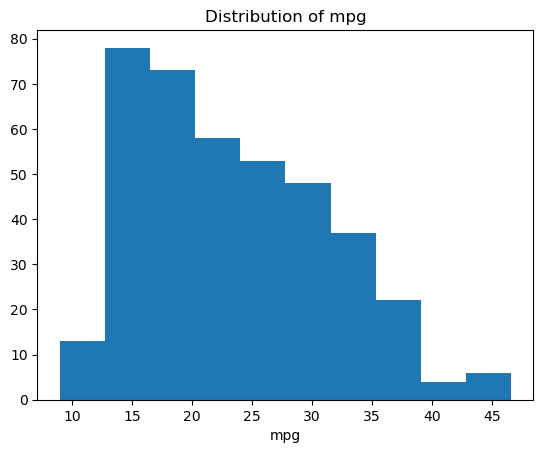

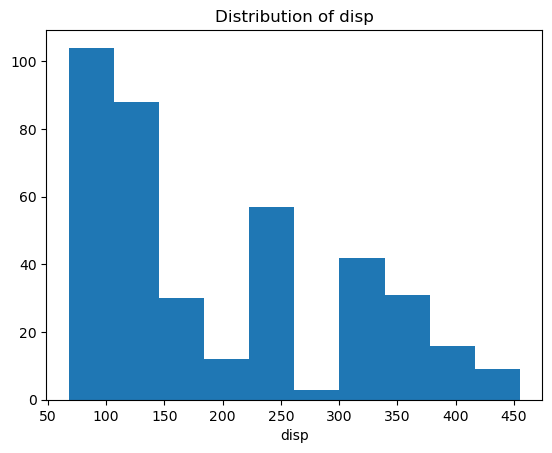

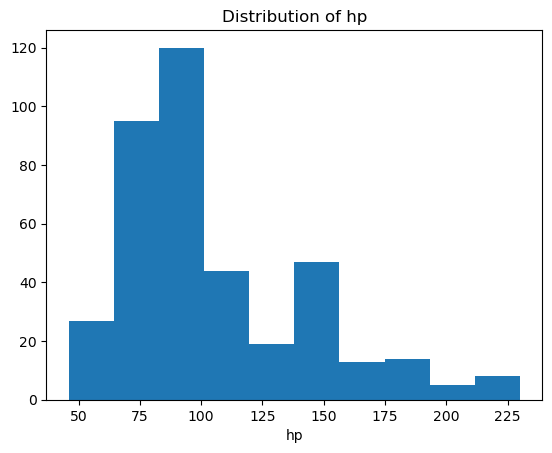

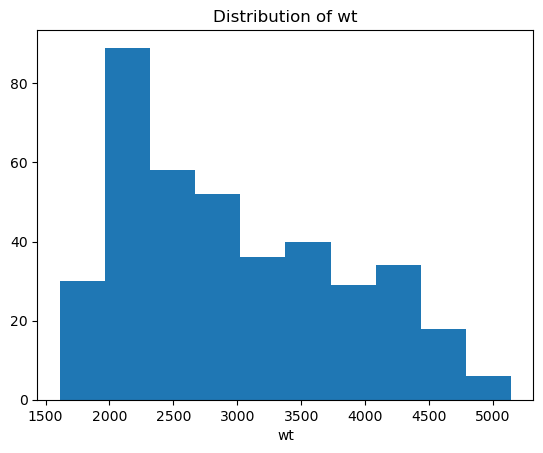

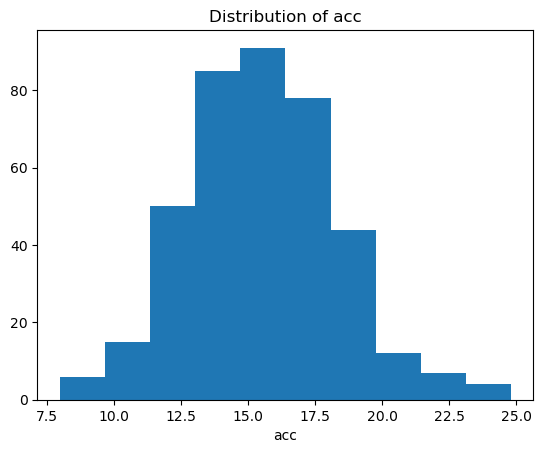

In [36]:
# Create a histogram
def create_histogram(column):
  plt.hist(merged_df[column])
  plt.title('Distribution of {}'.format(column))
  plt.xlabel(column)
  plt.show()

for column in ['mpg', 'disp', 'hp', 'wt', 'acc']:
  create_histogram(column)

### Visualize a boxplot to check distribution of the features.

#### MPG

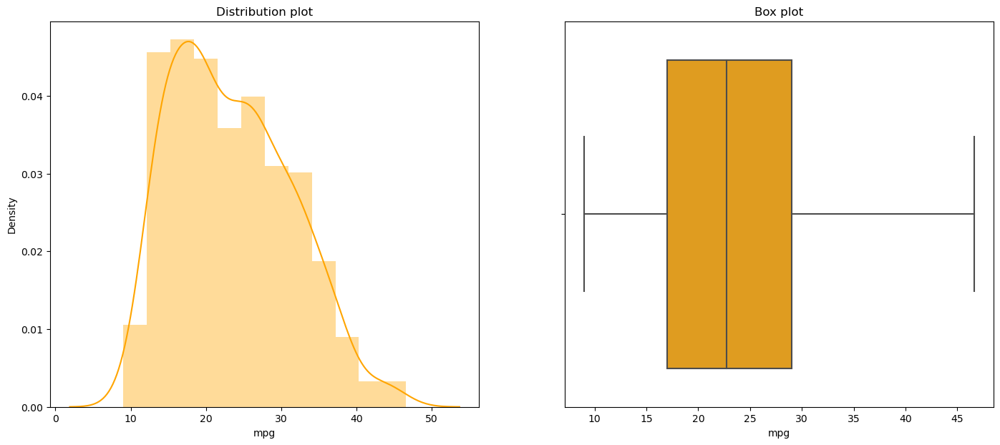

Total number of outliers in mpg: 0


In [37]:
# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(17, 7))

# Plot the distribution using a histogram
sns.distplot(merged_df['mpg'], ax=axes[0], color='orange')
axes[0].set_title('Distribution plot')

# Plot the boxplot
sns.boxplot(x='mpg', data=merged_df, orient='h', ax=axes[1], color='orange')
axes[1].set_title('Box plot')

# Show the plot
plt.show()

# Calculate the number of outliers
q25, q75 = merged_df['mpg'].quantile(0.25), merged_df['mpg'].quantile(0.75)
iqr = q75 - q25
threshold = iqr * 1.5
lower, upper = q25 - threshold, q75 + threshold
outliers = merged_df[(merged_df['mpg'] < lower) | (merged_df['mpg'] > upper)]
num_outliers = len(outliers)

print('Total number of outliers in mpg:', num_outliers)

#### disp

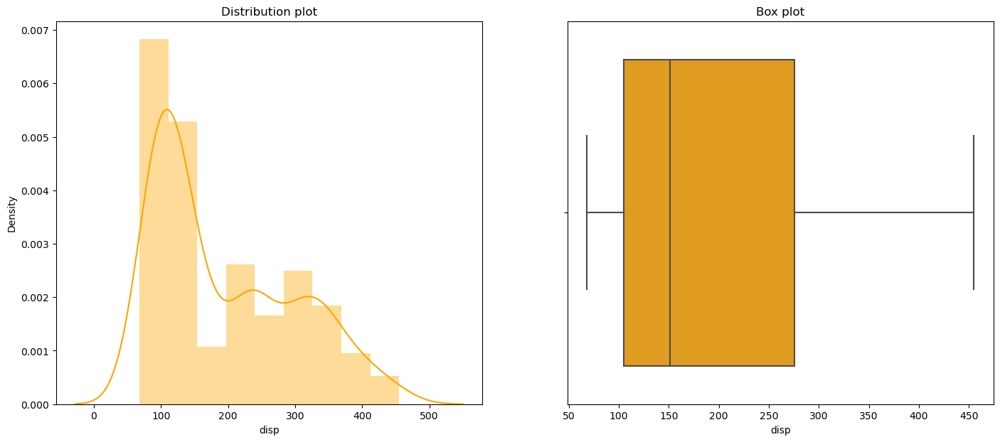

Total number of outliers in disp: 0


In [38]:
# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(17, 7))

# Plot the distribution using a histogram
sns.distplot(merged_df['disp'], ax=axes[0], color='orange')
axes[0].set_title('Distribution plot')

# Plot the boxplot
sns.boxplot(x='disp', data=merged_df, orient='h', ax=axes[1], color='orange')
axes[1].set_title('Box plot')

# Show the plot
plt.show()

# Calculate the number of outliers
q25, q75 = merged_df['disp'].quantile(0.25), merged_df['disp'].quantile(0.75)
iqr = q75 - q25
threshold = iqr * 1.5
lower, upper = q25 - threshold, q75 + threshold
outliers = merged_df[(merged_df['disp'] < lower) | (merged_df['disp'] > upper)]
num_outliers = len(outliers)

print('Total number of outliers in disp:', num_outliers)

#### hp

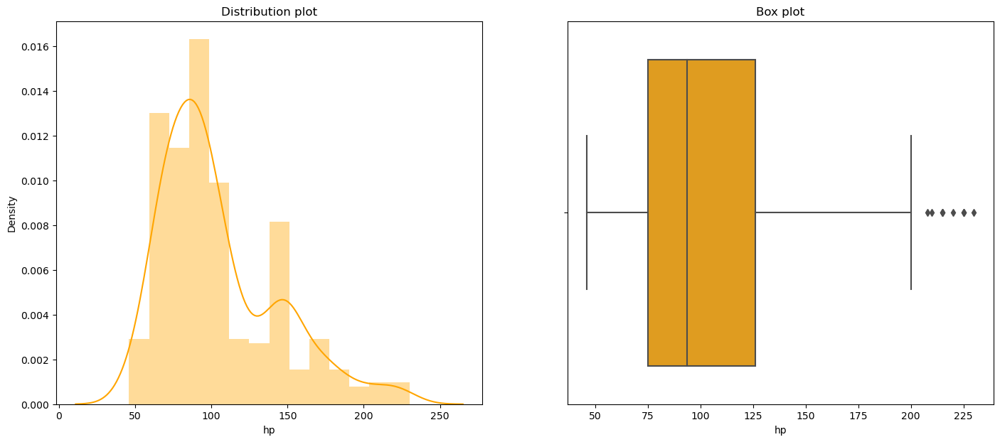

Total number of outliers in hp: 10


In [39]:
# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(17, 7))

# Plot the distribution using a histogram
sns.distplot(merged_df['hp'], ax=axes[0], color='orange')
axes[0].set_title('Distribution plot')

# Plot the boxplot
sns.boxplot(x='hp', data=merged_df, orient='h', ax=axes[1], color='orange')
axes[1].set_title('Box plot')

# Show the plot
plt.show()

# Calculate the number of outliers
q25, q75 = merged_df['hp'].quantile(0.25), merged_df['hp'].quantile(0.75)
iqr = q75 - q25
threshold = iqr * 1.5
lower, upper = q25 - threshold, q75 + threshold
outliers = merged_df[(merged_df['hp'] < lower) | (merged_df['hp'] > upper)]
num_outliers = len(outliers)

print('Total number of outliers in hp:', num_outliers)

#### wt

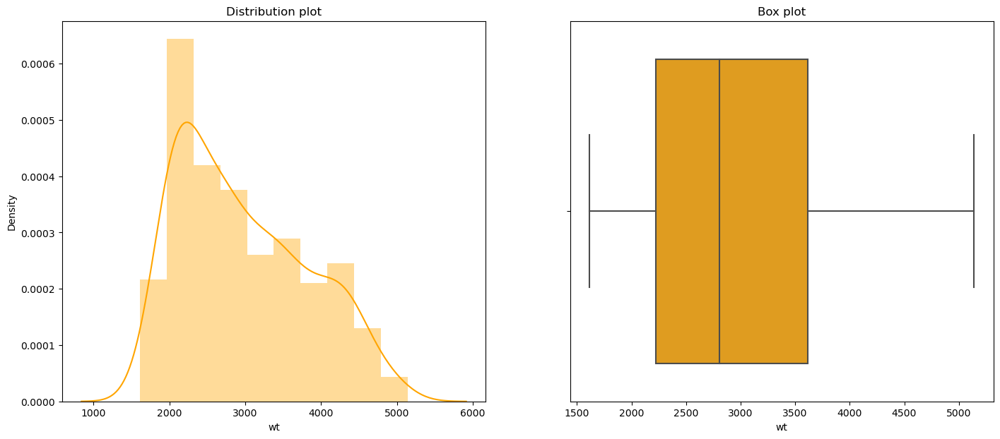

Total number of outliers in wt: 0


In [40]:
# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(17, 7))

# Plot the distribution using a histogram
sns.distplot(merged_df['wt'], ax=axes[0], color='orange')
axes[0].set_title('Distribution plot')

# Plot the boxplot
sns.boxplot(x='wt', data=merged_df, orient='h', ax=axes[1], color='orange')
axes[1].set_title('Box plot')

# Show the plot
plt.show()

# Calculate the number of outliers
q25, q75 = merged_df['wt'].quantile(0.25), merged_df['wt'].quantile(0.75)
iqr = q75 - q25
threshold = iqr * 1.5
lower, upper = q25 - threshold, q75 + threshold
outliers = merged_df[(merged_df['wt'] < lower) | (merged_df['wt'] > upper)]
num_outliers = len(outliers)

print('Total number of outliers in wt:', num_outliers)

#### Acc

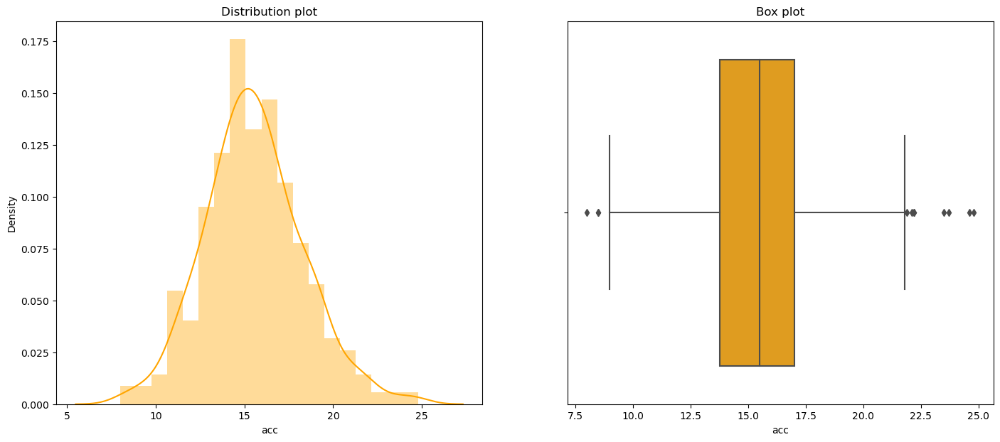

Total number of outliers in acc: 11


In [41]:
# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(17, 7))

# Plot the distribution using a histogram
sns.distplot(merged_df['acc'], ax=axes[0], color='orange')
axes[0].set_title('Distribution plot')

# Plot the boxplot
sns.boxplot(x='acc', data=merged_df, orient='h', ax=axes[1], color='orange')
axes[1].set_title('Box plot')

# Show the plot
plt.show()

# Calculate the number of outliers
q25, q75 = merged_df['acc'].quantile(0.25), merged_df['acc'].quantile(0.75)
iqr = q75 - q25
threshold = iqr * 1.5
lower, upper = q25 - threshold, q75 + threshold
outliers = merged_df[(merged_df['acc'] < lower) | (merged_df['acc'] > upper)]
num_outliers = len(outliers)

print('Total number of outliers in acc:', num_outliers)

We can observe from the above graphs that there are outliers present in the variables "acc" and "hp". However, since the question statement/FAQ explicitly states, "Since it is not mentioned here to treat outliers, prefer not to treat outliers," I am choosing to ignore them for now.

In [42]:
# Calculate the correlation matrix
correlation=merged_df.corr()

In [43]:
correlation

,mpg,cyl,disp,hp,wt,acc,yr,origin
mpg,1.000000,-0.777618,-0.805127,-0.778427,-0.832244,0.423329,0.580541,0.565209
cyl,-0.777618,1.000000,0.950823,0.842983,0.897527,-0.504683,-0.345647,-0.568932
disp,-0.805127,0.950823,1.000000,0.897257,0.932994,-0.543800,-0.369855,-0.614535
hp,-0.778427,0.842983,0.897257,1.000000,0.864538,-0.689196,-0.416361,-0.455171
wt,-0.832244,0.897527,0.932994,0.864538,1.000000,-0.416839,-0.309120,-0.585005
acc,0.423329,-0.504683,-0.543800,-0.689196,-0.416839,1.000000,0.290316,0.212746
yr,0.580541,-0.345647,-0.369855,-0.416361,-0.309120,0.290316,1.000000,0.181528
origin,0.565209,-0.568932,-0.614535,-0.455171,-0.585005,0.212746,0.181528,1.000000


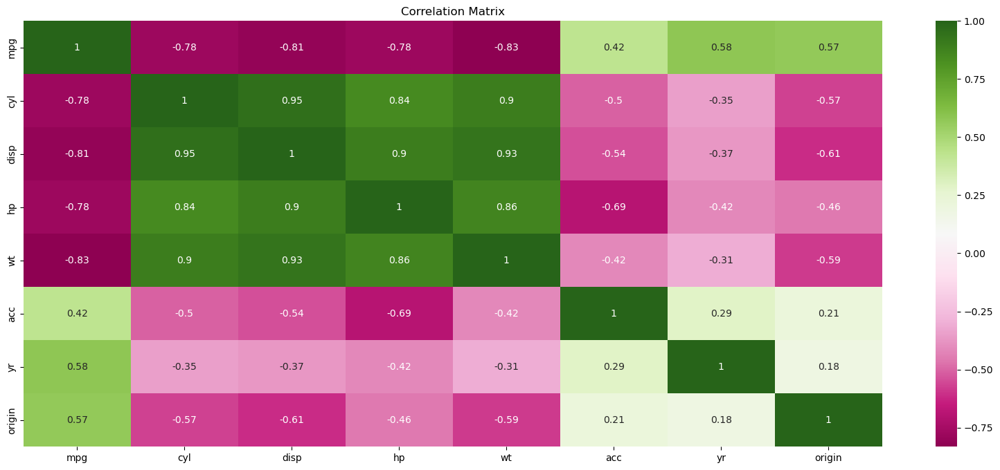

In [44]:
# Visualize the correlation matrix as a heatmap
plt.figure(figsize=(20,8))
corr_matrix= sns.heatmap(correlation, annot=True,cmap='PiYG', cbar=True)
plt.title('Correlation Matrix')
plt.show()

The correlation matrix reveals valuable insights about the variables. Firstly, there is a strong negative correlation between "mpg" (miles per gallon) and "cyl" (number of cylinders), "disp" (engine displacement), "hp" (horsepower), and "wt" (weight). This suggests that as variables 'cyl', 'disp', 'hp' and 'wt' increase, 'mpg' tends to decrease.

Secondly, there is a moderate positive correlation between "mpg" and "yr" (model year). This indicates that as the model year increases, the fuel efficiency(mpg) of the vehicles generally improves. This finding suggests that newer cars tend to offer better fuel efficiency compared to older models.

In [45]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler
import pandas as pd

# Select categorical and numerical columns
categorical_cols = ['origin']
numerical_cols = ['mpg', 'cyl', 'disp', 'hp', 'wt', 'acc', 'yr']

# Perform one-hot encoding on the categorical column
one_hot_encoder = OneHotEncoder(sparse=False)
encoded_cols = one_hot_encoder.fit_transform(merged_df[categorical_cols])
encoded_col_names = one_hot_encoder.get_feature_names_out(categorical_cols)

encoded_df = pd.DataFrame(encoded_cols, columns=encoded_col_names)

# Perform standardization on the numerical columns
scaler = StandardScaler()
scaled_cols = scaler.fit_transform(merged_df[numerical_cols])
scaled_df = pd.DataFrame(scaled_cols, columns=numerical_cols)

# Concatenate the encoded and scaled columns with the original DataFrame
new_df = pd.concat([encoded_df, scaled_df], axis=1)

In [46]:
new_df

,origin_1,origin_2,origin_3,mpg,cyl,disp,hp,wt,acc,yr
0,1.0,0.0,0.0,-0.698638,1.483947,1.077290,0.664133,0.620540,-1.285258,-1.625315
1,1.0,0.0,0.0,-1.083498,1.483947,1.488732,1.574594,0.843334,-1.466724,-1.625315
2,1.0,0.0,0.0,-0.698638,1.483947,1.182542,1.184397,0.540382,-1.648189,-1.625315
3,1.0,0.0,0.0,-0.955212,1.483947,1.048584,1.184397,0.536845,-1.285258,-1.625315
4,1.0,0.0,0.0,-0.826925,1.483947,1.029447,0.924265,0.555706,-1.829655,-1.625315
...,...,...,...,...,...,...,...,...,...,...
387,1.0,0.0,0.0,0.455941,-0.864014,-0.520637,-0.480448,-0.221125,0.021294,1.636410
388,0.0,1.0,0.0,2.636813,-0.864014,-0.932079,-1.364896,-0.999134,3.287676,1.636410
389,1.0,0.0,0.0,1.097374,-0.864014,-0.568479,-0.532474,-0.804632,-1.430430,1.636410
390,1.0,0.0,0.0,0.584228,-0.864014,-0.712005,-0.662540,-0.415627,1.110088,1.636410


### 3. Clustering:

### A. Apply K-Means clustering for 2 to 10 clusters. 

In [47]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Define the range of clusters
min_clusters = 2
max_clusters = 10

# Perform k-means clustering for different numbers of clusters
inertias = []
for n_clusters in range(min_clusters, max_clusters + 1):
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(new_df)
    inertias.append(kmeans.inertia_)

### B. Plot a visual and find elbow point. 

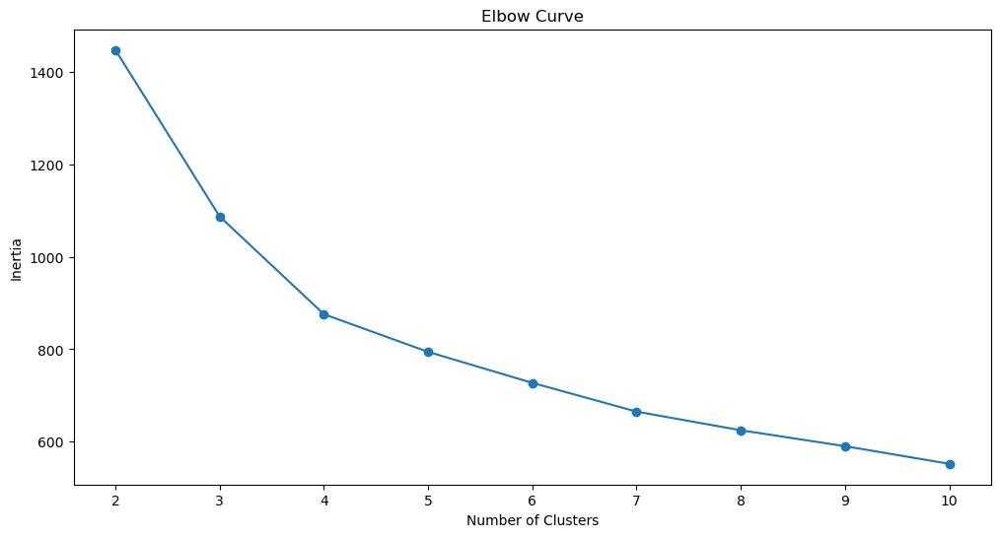

In [48]:
# Plot the elbow curve to determine the optimal number of clusters
plt.figure(figsize=(12, 6))
plt.plot(range(min_clusters, max_clusters + 1), inertias, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Curve')
plt.show()

We could see a clear curve and cluster 4 seems to be the elbow point.

### C. On the above visual, highlight which are the possible Elbow points.

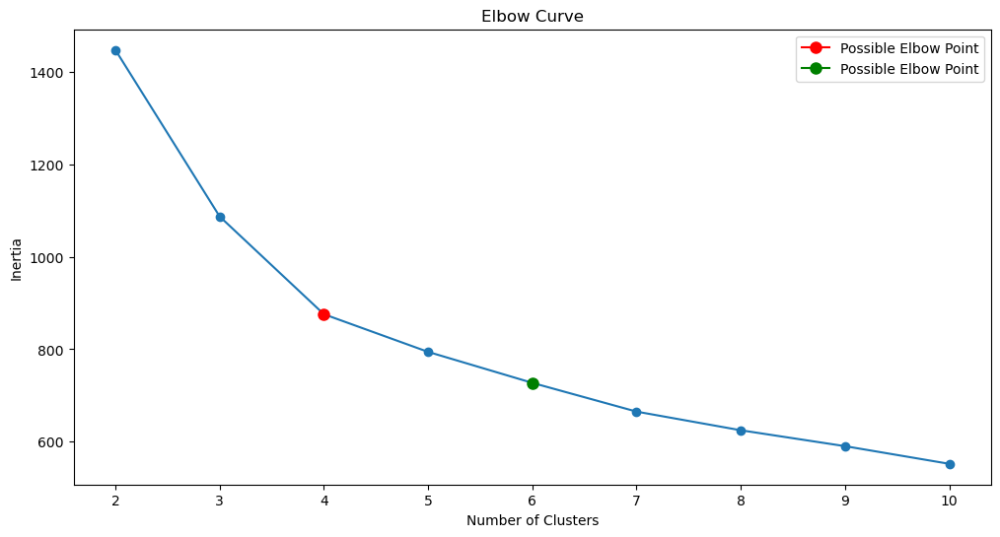

In [49]:
plt.figure(figsize=(12, 6))
# Plot the elbow curve to determine the optimal number of clusters
plt.plot(range(min_clusters, max_clusters + 1), inertias, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Curve')

# Highlight the possible elbow points
plt.plot(4, inertias[2], marker='o', markersize=8, color='red', label='Possible Elbow Point')
plt.plot(6, inertias[4], marker='o', markersize=8, color='green', label='Possible Elbow Point')

plt.xticks(range(min_clusters, max_clusters+1))

plt.legend()
plt.show()

Elbow points are plot places where the drop in WCSS begins to slow, forming an elbow shape. An elbow point can be found at plot point 4 (no. of clusters = 4). Similarly, '6' is an elbow point, although it is not as nice as '4'.

### D. Train a K-means clustering model once again on the optimal number of clusters.

In [50]:
from sklearn.cluster import KMeans

# Initialize the K-means model with 4 clusters
kmeans = KMeans(n_clusters=4, random_state=42)

# Fit the model to the processed_df data
kmeans.fit(new_df)

# Get the cluster labels for each data point
cluster_labels = kmeans.labels_

# Assign the cluster labels back to the processed_df dataframe
new_df['cluster'] = cluster_labels

### E. Add a new feature in the DataFrame which will have labels based upon cluster value.

In [51]:
# Create a dictionary to map cluster labels to meaningful labels
label_mapping = {0: 'Label 1', 1: 'Label 2', 2: 'Label 3', 3: 'Label 4'}

# Create a new feature based on the cluster labels
new_df['label'] = new_df['cluster'].map(label_mapping)

### F. Plot a visual and color the datapoints based upon clusters.

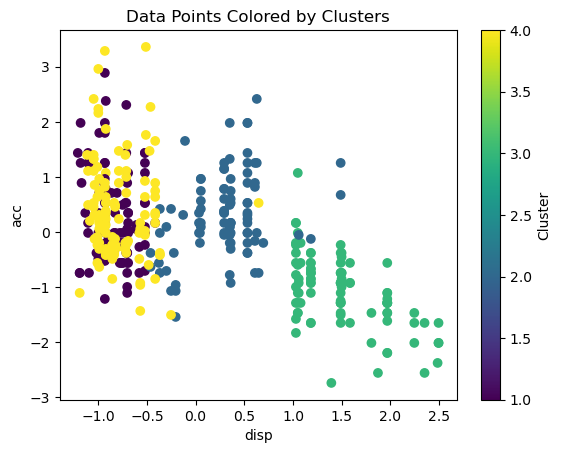

In [52]:
# Remove 'Label ' prefix from each value in the 'label' column
new_df['label'] = new_df['label'].str.replace('Label ', '')

# Convert 'label' column to integers
new_df['label'] = new_df['label'].astype(int)

plt.scatter(new_df['disp'], new_df['acc'], c=new_df['label'], cmap='viridis')
plt.xlabel('disp')
plt.ylabel('acc')
plt.title('Data Points Colored by Clusters')
plt.colorbar(label='Cluster')
plt.show()

In [53]:
new_df

,origin_1,origin_2,origin_3,mpg,cyl,disp,hp,wt,acc,yr,cluster,label
0,1.0,0.0,0.0,-0.698638,1.483947,1.077290,0.664133,0.620540,-1.285258,-1.625315,2,3
1,1.0,0.0,0.0,-1.083498,1.483947,1.488732,1.574594,0.843334,-1.466724,-1.625315,2,3
2,1.0,0.0,0.0,-0.698638,1.483947,1.182542,1.184397,0.540382,-1.648189,-1.625315,2,3
3,1.0,0.0,0.0,-0.955212,1.483947,1.048584,1.184397,0.536845,-1.285258,-1.625315,2,3
4,1.0,0.0,0.0,-0.826925,1.483947,1.029447,0.924265,0.555706,-1.829655,-1.625315,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...
387,1.0,0.0,0.0,0.455941,-0.864014,-0.520637,-0.480448,-0.221125,0.021294,1.636410,3,4
388,0.0,1.0,0.0,2.636813,-0.864014,-0.932079,-1.364896,-0.999134,3.287676,1.636410,3,4
389,1.0,0.0,0.0,1.097374,-0.864014,-0.568479,-0.532474,-0.804632,-1.430430,1.636410,3,4
390,1.0,0.0,0.0,0.584228,-0.864014,-0.712005,-0.662540,-0.415627,1.110088,1.636410,3,4


### G. Pass a new DataPoint and predict which cluster it belongs to.

In [54]:
import pandas as pd
from sklearn.cluster import KMeans

new_data = pd.DataFrame({
    'mpg': [100],
    'cyl': [223],
    'disp': [345],
    'hp': [496],
    'wt': [709],
    'acc': [600],
    'yr': [700],
    'origin_1': [1],
    'origin_2': [0],
    'origin_3': [3]
})

# Predict the cluster for the new data point
new_data_cluster = kmeans.predict(new_data.values)

# Map the predicted cluster label to a meaningful label
predicted_label = label_mapping[new_data_cluster[0]]

print("Predicted cluster label:", predicted_label)

Predicted cluster label: Label 3


## Part - B

- **DOMAIN:** Automobile
- **CONTEXT:** The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles.
- **DATA DESCRIPTION:** The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars.
- All the features are numeric i.e. geometric features extracted from the silhouette.
- **PROJECT OBJECTIVE:** Apply dimensionality reduction technique – PCA and train a model and compare relative results

### 1. Data Understanding & Cleaning:

### A. Read 'vehicle.csv' and save as DataFrame.

In [55]:
df = pd.read_csv('vehicle.csv')

In [56]:
df.head(10)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus
5,107,NaN,106.0,172.0,50.0,6,255.0,26.0,28.0,169,280.0,957.0,264.0,85.0,5.0,9.0,181.0,183,bus
6,97,43.0,73.0,173.0,65.0,6,153.0,42.0,19.0,143,176.0,361.0,172.0,66.0,13.0,1.0,200.0,204,bus
7,90,43.0,66.0,157.0,65.0,9,137.0,48.0,18.0,146,162.0,281.0,164.0,67.0,3.0,3.0,193.0,202,van
8,86,34.0,62.0,140.0,61.0,7,122.0,54.0,17.0,127,141.0,223.0,112.0,64.0,2.0,14.0,200.0,208,van
9,93,44.0,98.0,NaN,62.0,11,183.0,36.0,22.0,146,202.0,505.0,152.0,64.0,4.0,14.0,195.0,204,car


In [57]:
df.tail(10)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
836,87,45.0,66.0,139.0,58.0,8,140.0,47.0,18.0,148,168.0,294.0,175.0,73.0,3.0,12.0,188.0,196,van
837,94,46.0,77.0,169.0,60.0,8,158.0,42.0,20.0,148,181.0,373.0,181.0,67.0,12.0,2.0,193.0,199,car
838,95,43.0,76.0,142.0,57.0,10,151.0,44.0,19.0,149,173.0,339.0,159.0,71.0,2.0,23.0,187.0,200,van
839,90,44.0,72.0,157.0,64.0,8,137.0,48.0,18.0,144,159.0,283.0,171.0,65.0,9.0,4.0,196.0,203,van
840,93,34.0,66.0,140.0,56.0,7,130.0,51.0,18.0,120,151.0,251.0,114.0,62.0,5.0,29.0,201.0,207,car
841,93,39.0,87.0,183.0,64.0,8,169.0,40.0,20.0,134,200.0,422.0,149.0,72.0,7.0,25.0,188.0,195,car
842,89,46.0,84.0,163.0,66.0,11,159.0,43.0,20.0,159,173.0,368.0,176.0,72.0,1.0,20.0,186.0,197,van
843,106,54.0,101.0,222.0,67.0,12,222.0,30.0,25.0,173,228.0,721.0,200.0,70.0,3.0,4.0,187.0,201,car
844,86,36.0,78.0,146.0,58.0,7,135.0,50.0,18.0,124,155.0,270.0,148.0,66.0,0.0,25.0,190.0,195,car
845,85,36.0,66.0,123.0,55.0,5,120.0,56.0,17.0,128,140.0,212.0,131.0,73.0,1.0,18.0,186.0,190,van


In [58]:
# Shape and column of the data
print("Shape of df:")
print(df.shape)
print('\n')
print("Columns of df:")
print(df.columns)
print('\n')
row, column = df.shape
print('The dataset contains', row, 'rows and', column, 'columns')

Shape of df:
(846, 19)


Columns of df:
Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')


The dataset contains 846 rows and 19 columns


In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

- Only one column 'class' has the data type 'object' and rest of the columns are 'numerical' data type.
- We can observe that the dataset contains missing values in several columns.

### B. Check percentage of missing values and impute with correct approach.

In [60]:
# missing values present in the dataset
df.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [61]:
# Check the percentage of missing values in each column
missing_values = df.isnull().mean() * 100

In [62]:
missing_values

compactness                    0.000000
circularity                    0.591017
distance_circularity           0.472813
radius_ratio                   0.709220
pr.axis_aspect_ratio           0.236407
max.length_aspect_ratio        0.000000
scatter_ratio                  0.118203
elongatedness                  0.118203
pr.axis_rectangularity         0.354610
max.length_rectangularity      0.000000
scaled_variance                0.354610
scaled_variance.1              0.236407
scaled_radius_of_gyration      0.236407
scaled_radius_of_gyration.1    0.472813
skewness_about                 0.709220
skewness_about.1               0.118203
skewness_about.2               0.118203
hollows_ratio                  0.000000
class                          0.000000
dtype: float64

In [63]:
# Columns with missing values
missingCols = df.columns[df.isna().sum()/len(df.index) * 100 != 0]
print("Number of columns with missing values: {}".format(len(missingCols)))

Number of columns with missing values: 14


We will be imputing the missing values with the median.

In [64]:
median = lambda x: x.fillna(x.median())
for col in missingCols:
    df[col].fillna(df[col].median(),inplace=True)

In [65]:
# Re-checking the missing values
df.isnull().mean() * 100

compactness                    0.0
circularity                    0.0
distance_circularity           0.0
radius_ratio                   0.0
pr.axis_aspect_ratio           0.0
max.length_aspect_ratio        0.0
scatter_ratio                  0.0
elongatedness                  0.0
pr.axis_rectangularity         0.0
max.length_rectangularity      0.0
scaled_variance                0.0
scaled_variance.1              0.0
scaled_radius_of_gyration      0.0
scaled_radius_of_gyration.1    0.0
skewness_about                 0.0
skewness_about.1               0.0
skewness_about.2               0.0
hollows_ratio                  0.0
class                          0.0
dtype: float64

We have successfully handled the missing values present in the data set.

In [66]:
# Describe data
df.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.00,119.0
circularity,846.0,44.823877,6.134272,33.0,40.00,44.0,49.00,59.0
distance_circularity,846.0,82.100473,15.741569,40.0,70.00,80.0,98.00,112.0
radius_ratio,846.0,168.874704,33.401356,104.0,141.00,167.0,195.00,333.0
pr.axis_aspect_ratio,846.0,61.677305,7.882188,47.0,57.00,61.0,65.00,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.00,55.0
scatter_ratio,846.0,168.887707,33.197710,112.0,147.00,157.0,198.00,265.0
elongatedness,846.0,40.936170,7.811882,26.0,33.00,43.0,46.00,61.0
pr.axis_rectangularity,846.0,20.580378,2.588558,17.0,19.00,20.0,23.00,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.00,188.0


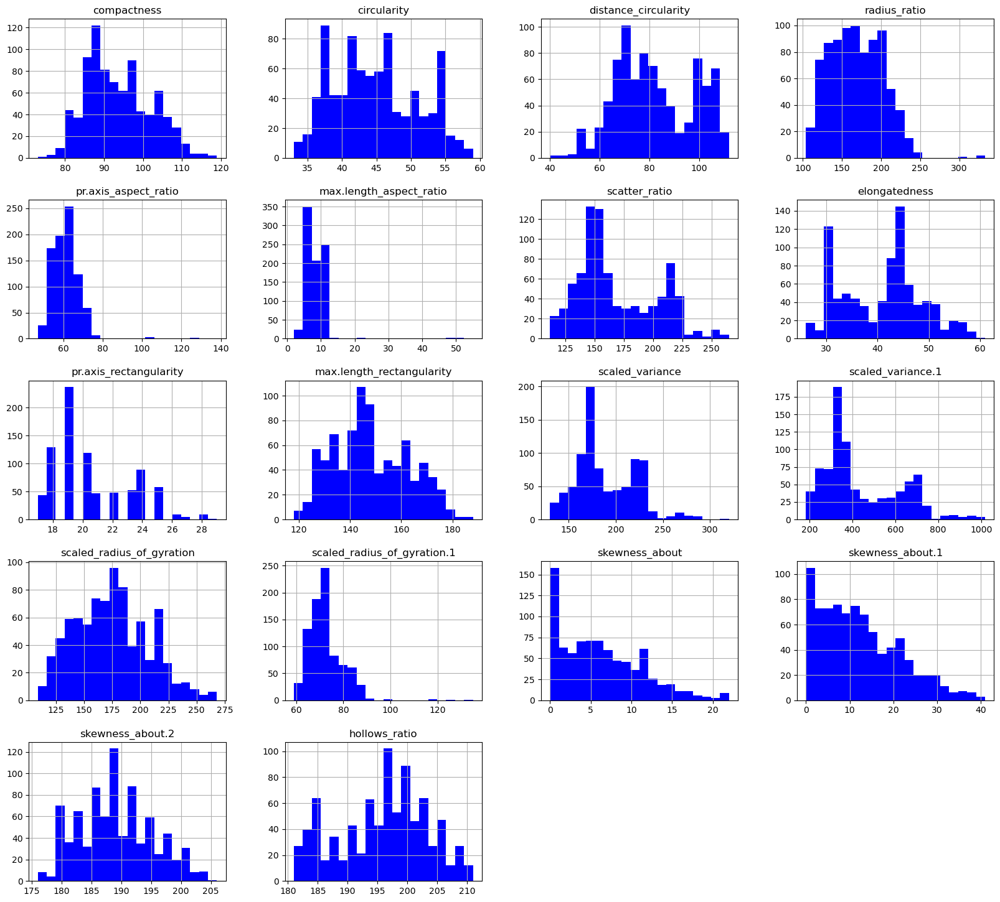

In [67]:
#plotting the distribution of the numerical variables
df.hist(bins = 20, figsize = (20, 18), color = 'blue')
plt.show()

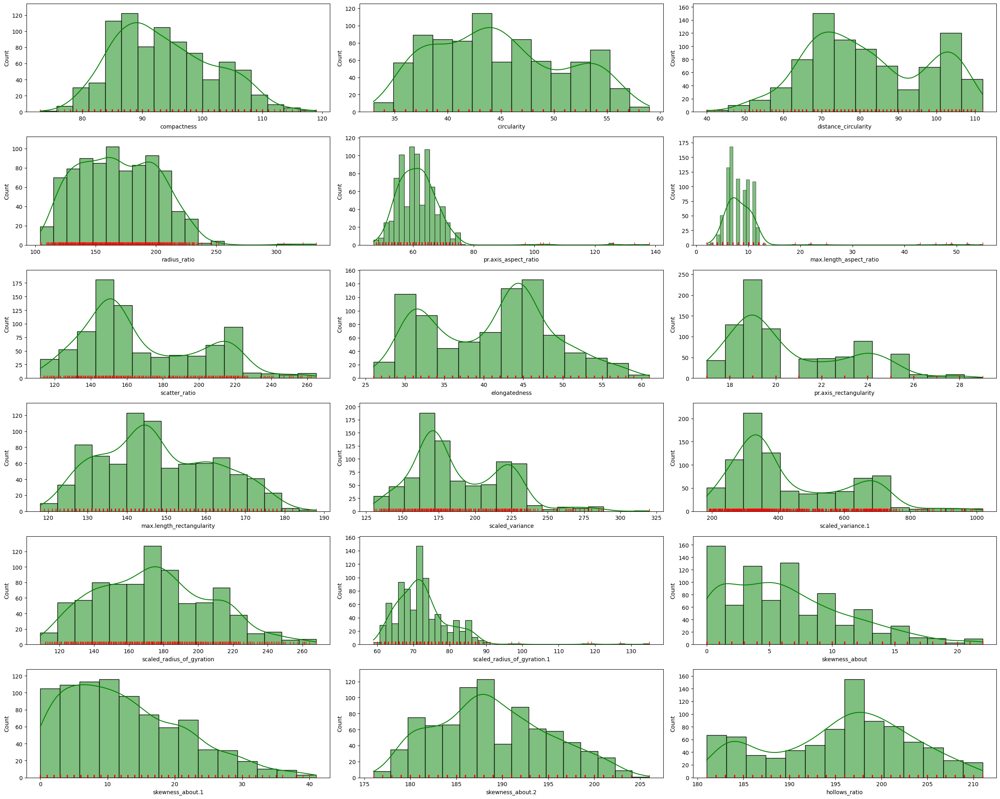

In [68]:
# Distribution Plots of all independent variables.
plt.figure(figsize=(25, 20))
col = 1
for i in df.drop(columns='class').columns:
    plt.subplot(6, 3, col)
    sns.histplot(df[i], color='green', kde=True)
    sns.rugplot(df[i], color='r')
    col += 1

plt.tight_layout()
plt.show()

### C. Visualize a Pie-chart and print percentage of values for variable 'class'.

In [69]:
# Calculate the value counts and percentages for 'class'
class_counts = df['class'].value_counts()
class_percentages = class_counts / len(df) * 100

In [70]:
class_counts

car    429
bus    218
van    199
Name: class, dtype: int64

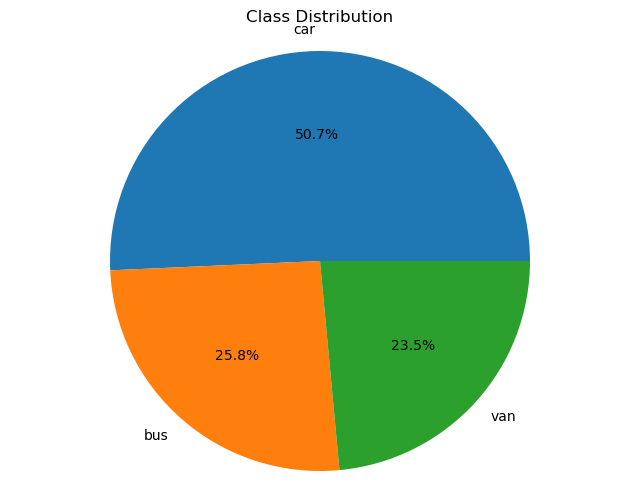

In [71]:
# Create a pie chart
plt.figure(figsize=(8, 6))
plt.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%')
plt.title('Class Distribution')
plt.axis('equal')
plt.show()

In [72]:
# Print the percentage of values for 'class'
print("Percentage of values for 'class':")
print(class_percentages)

Percentage of values for 'class':
car    50.709220
bus    25.768322
van    23.522459
Name: class, dtype: float64


### D. Check for duplicate rows in the data and impute with correct approach.

In [73]:
# Check for duplicate rows
duplicate_rows = df.duplicated()

# Count the number of duplicate rows
num_duplicates = duplicate_rows.sum()

# Determine if the dataset has any duplicate rows
if num_duplicates > 0:
    print("The dataset has duplicate rows.")
else:
    print("The dataset does not have any duplicate rows.")

The dataset does not have any duplicate rows.


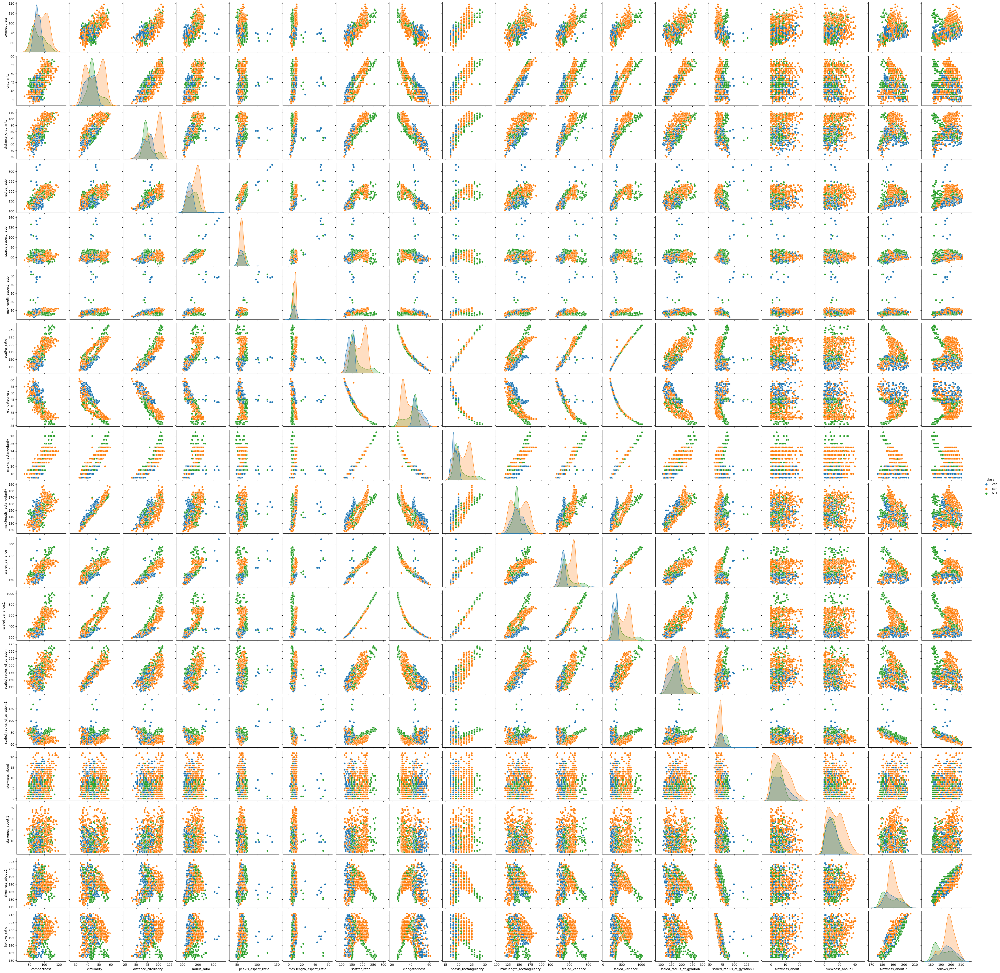

In [74]:
# Plot pairplot of vehicle 1 and classified as per class
sns.pairplot(data=df, hue = 'class', diag_kind = 'kde');

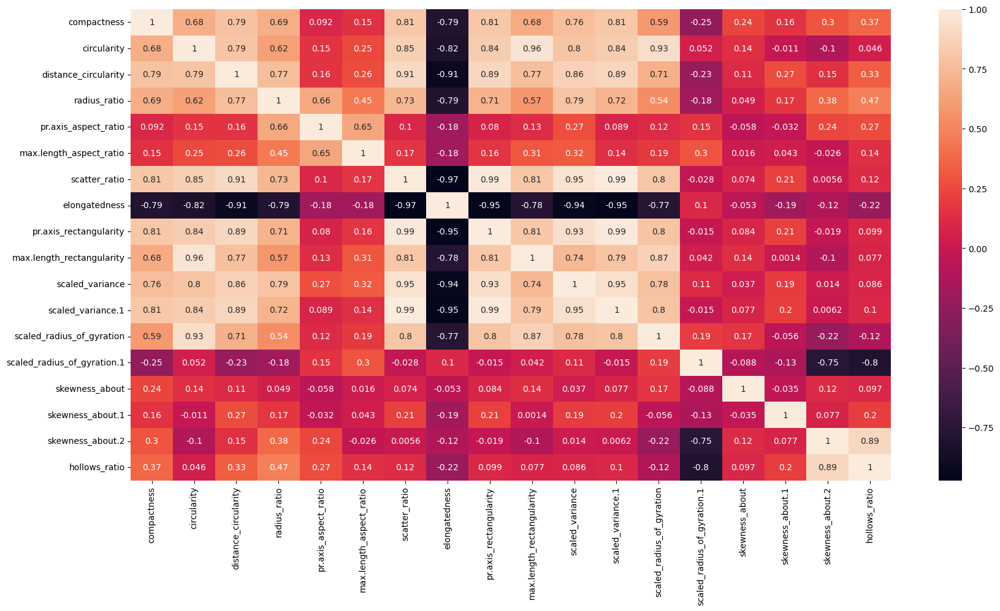

In [75]:
#checking for correlation
plt.figure(figsize=(20,10))
corr=df.corr()
sns.heatmap(corr,annot=True);

### 2. Data Preparation: 

### A. Split data into X and Y.

In [76]:
# Splitting data into X and y
X = df.drop('class', axis=1)  # Independent variables
y = df['class']  # Dependent variable

In [77]:
from sklearn.model_selection import train_test_split

# Split X and Y into training and test set in 80:20 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

# Print shape of the data split
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((676, 18), (170, 18), (676,), (170,))

### B. Standardize the Data.

In [78]:
from sklearn.preprocessing import StandardScaler

# Create a StandardScaler object
scaler = StandardScaler()

# Perform standardization on the training data
normalized_x_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)

# Display the header of normalized X_train
normalized_x_train.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,-0.581861,0.342899,0.042356,4.503746,8.714319,8.151668,-0.342929,0.278004,-0.237311,1.033734,1.248347,-0.439164,0.012915,3.160152,-1.295902,0.160019,-0.797977,-0.216177
1,-1.550674,-0.148202,-0.649855,-0.894152,-0.214036,-0.541322,-0.492452,0.405501,-0.621097,-0.150562,-0.290095,-0.534559,0.074077,1.090757,-1.088803,0.270625,-1.125302,-1.280920
2,0.023647,0.342899,0.168212,4.828210,9.325850,8.358643,-0.432643,0.278004,-0.621097,0.476418,4.105453,-0.495278,0.349302,8.074967,1.189289,-0.393012,-0.143326,0.050008
3,0.992460,1.488802,1.112135,-0.186231,-1.070179,0.286582,1.301821,-1.251960,1.297833,1.730378,0.934379,1.272334,0.777430,0.444071,1.189289,1.597899,-0.306989,-0.083085
4,0.386952,1.652502,0.860422,0.020246,-0.947873,0.286582,1.391534,-1.251960,1.297833,1.730378,0.934379,1.362117,1.297301,0.314733,-1.295902,-0.946043,-0.797977,-0.349270


In [79]:
# Perform standardization on the test data
normalized_x_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

# Display the header of normalized X_test
normalized_x_test.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,-0.460760,0.179199,-0.461070,-1.071132,-0.825567,0.493558,-0.283120,0.278004,-0.237311,0.894405,-0.509872,-0.411106,-0.139988,0.573408,-1.295902,0.381231,-1.125302,-0.482363
1,1.840172,1.161401,0.797494,0.580684,-0.458648,-0.955274,1.720484,-1.506954,1.681619,0.685412,2.284440,1.872761,1.266720,1.220094,-1.295902,0.713050,-0.306989,-1.280920
2,0.750257,-0.639303,-0.461070,1.052631,1.131333,-0.748298,0.195353,-0.614475,0.146475,-0.707877,0.463428,0.206155,-0.751600,-0.073278,0.153793,0.713050,1.329638,0.183101
3,0.750257,0.670300,-0.146429,1.082128,1.009026,-0.541322,0.404684,-0.741972,0.146475,0.546083,0.526221,0.419391,0.685689,0.056059,-0.674604,0.049413,1.493301,0.449287
4,0.144749,-0.475603,0.860422,0.816657,0.397495,0.079606,0.255162,-0.486978,0.146475,-0.498884,0.306444,0.178098,-0.812761,-0.719964,-1.088803,1.819112,0.674987,0.582379


### 3. Model Building: 

### A. Train a base Classification model using SVM.

In [80]:
# Base SVM Model
from sklearn.svm import SVC

# Building a Support Vector Machine on train data
svc1 = SVC()

# Fit the training data
svc1.fit(normalized_x_train, y_train)

# Make predictions on the test data
svc_y_pred = svc1.predict(normalized_x_test)

# check the accuracy on the training & test set
print("Training accuracy is: ",svc1.score(normalized_x_train, y_train))
print("Test accuracy is: ",svc1.score(normalized_x_test, y_test))

Training accuracy is:  0.9807692307692307
Test accuracy is:  0.9588235294117647


### B. Print Classification metrics for train data.

In [81]:
from sklearn.metrics import classification_report

# Fit the training data
svc1.fit(normalized_x_train, y_train)

# Make predictions on the train data
svc_train_pred = svc1.predict(normalized_x_train)

# Print classification report
print("Classification Report - Train Data:")
print(classification_report(y_train, svc_train_pred))

Classification Report - Train Data:
              precision    recall  f1-score   support

         bus       0.99      0.98      0.98       181
         car       0.99      0.99      0.99       339
         van       0.96      0.97      0.96       156

    accuracy                           0.98       676
   macro avg       0.98      0.98      0.98       676
weighted avg       0.98      0.98      0.98       676



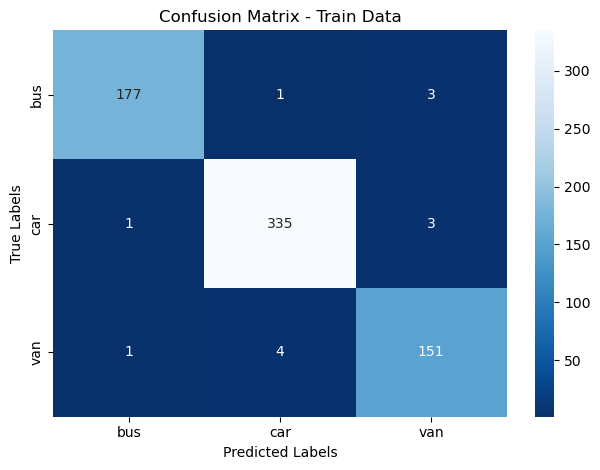

In [82]:
from sklearn.metrics import confusion_matrix

# Generate confusion matrix for the training data
confusion_mat_train = confusion_matrix(y_train, svc_train_pred)

# Create a heatmap
sns.heatmap(confusion_mat_train, annot=True, fmt="d", cmap="Blues_r", xticklabels=['bus','car','van'], yticklabels=['bus','car','van'])

# Set labels, title, and layout
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix - Train Data")
plt.tight_layout()

# Display the heatmap
plt.show()

### C. Apply PCA on the data with 10 components.

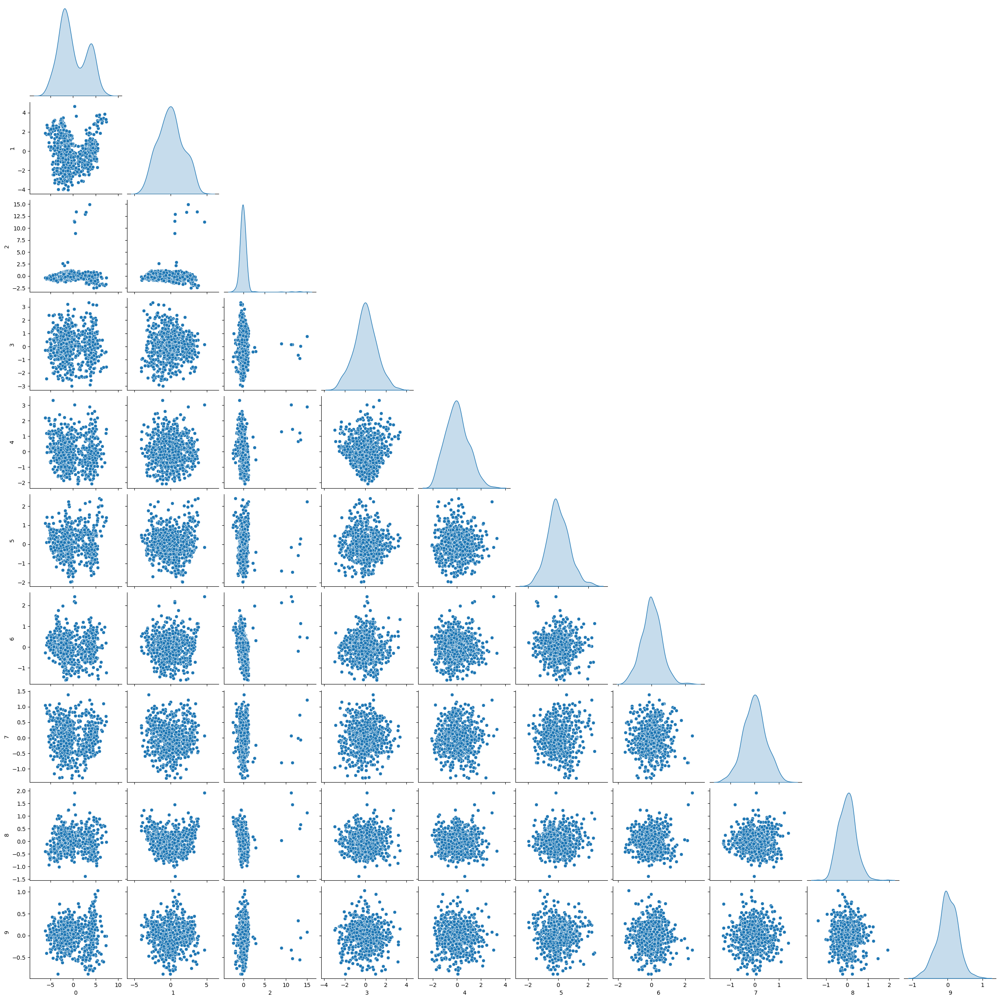

In [83]:
from sklearn.decomposition import PCA

# Create a PCA object with 10 components
pca = PCA(n_components=10)

# Fit and transform the normalized training data using PCA
pca_x_train = pca.fit_transform(normalized_x_train)

# Plot the resulting pairplot from reduced data
sns.pairplot(pd.DataFrame(pca_x_train), diag_kind='kde', corner=True)

### D. Visualize Cumulative Variance Explained with Number of Components.

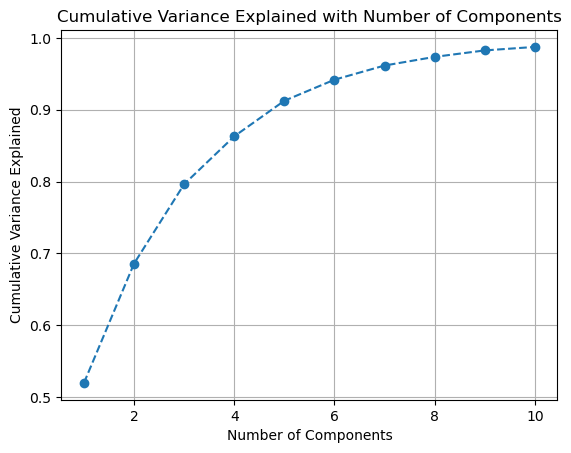

In [84]:
# Calculate the cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

# Plot the cumulative explained variance ratio
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained')
plt.title('Cumulative Variance Explained with Number of Components')
plt.grid(True)
plt.show()

### E. Draw a horizontal line on the above plot to highlight the threshold of 90%.

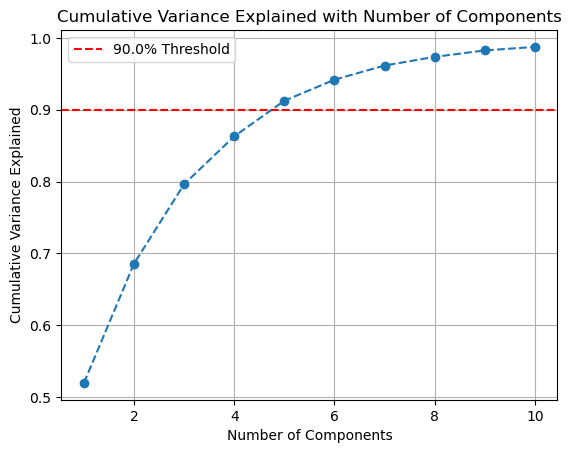

In [85]:
# Calculate the cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

# Plot the cumulative explained variance ratio
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o',linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained')
plt.title('Cumulative Variance Explained with Number of Components')
plt.grid(True)

# Add a horizontal line at 90% cumulative variance
threshold = 0.9
plt.axhline(y=threshold, color='r', linestyle='--', label=f'{threshold*100}% Threshold')
plt.legend()

plt.show()

### F. Apply PCA on the data. This time Select Minimum Components with 90% or above variance explained.

In [86]:
# Create PCA model with 5 components as 90% or more variance is explained by this
pca1 = PCA(n_components=5)

# Fit the training data
pca1.fit(normalized_x_train)

PCA(n_components=5)

In [87]:
# Check out the new components
df_comp1 = pd.DataFrame(pca1.components_,columns=list(normalized_x_train))
df_comp1.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.274888,0.293598,0.305711,0.266495,0.076370,0.091408,0.317433,-0.314703,0.314289,0.283602,0.308902,0.313958,0.272633,-0.021911,0.039859,0.059175,0.031228,0.075474
1,-0.127067,0.122994,-0.079504,-0.187492,-0.113499,0.010593,0.048796,0.012550,0.059539,0.114355,0.067432,0.055878,0.212453,0.484249,-0.048729,-0.131170,-0.542112,-0.542521
2,-0.113153,-0.026457,-0.054280,0.280987,0.635259,0.591631,-0.097273,0.058511,-0.109356,-0.022522,0.071807,-0.107367,-0.034399,0.297675,-0.107633,-0.071976,0.016783,0.046256
3,0.084399,0.179769,-0.065280,-0.036218,0.038596,0.026506,-0.095282,0.082996,-0.092100,0.177955,-0.116870,-0.090528,0.195978,-0.062690,0.620639,-0.658192,0.108360,0.048318
4,0.068182,-0.095534,0.046048,-0.041552,-0.038952,0.191874,-0.009093,0.074615,0.009736,-0.078700,0.010981,-0.010887,-0.066677,0.152632,0.726120,0.605098,-0.096631,-0.037324


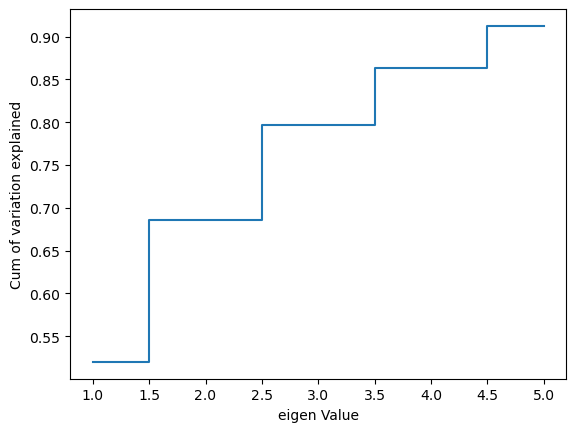

In [88]:
# Plot cumulative variances vs eigen values
plt.step(list(range(1,6)),np.cumsum(pca1.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

In [89]:
# Create new dataset with the trained PCA model
pca1_data = pca1.transform(normalized_x_train)
pca1_data

array([[ 2.68537705,  0.64116145, 12.91249858, -0.64761693,  0.64822572],
       [-1.9147351 ,  2.16057348,  0.02840605, -1.00360621, -0.44545286],
       [ 3.6910727 ,  2.42832137, 14.96075092,  0.77651727,  2.89508444],
       ...,
       [ 0.04455944, -1.53445229, -0.06406939, -1.69880018,  0.15417026],
       [-0.5943903 ,  1.66176658, -0.16665303, -0.38560996, -0.53003688],
       [ 2.8432663 ,  2.18778344, 13.29098139, -0.88750177,  1.22038393]])

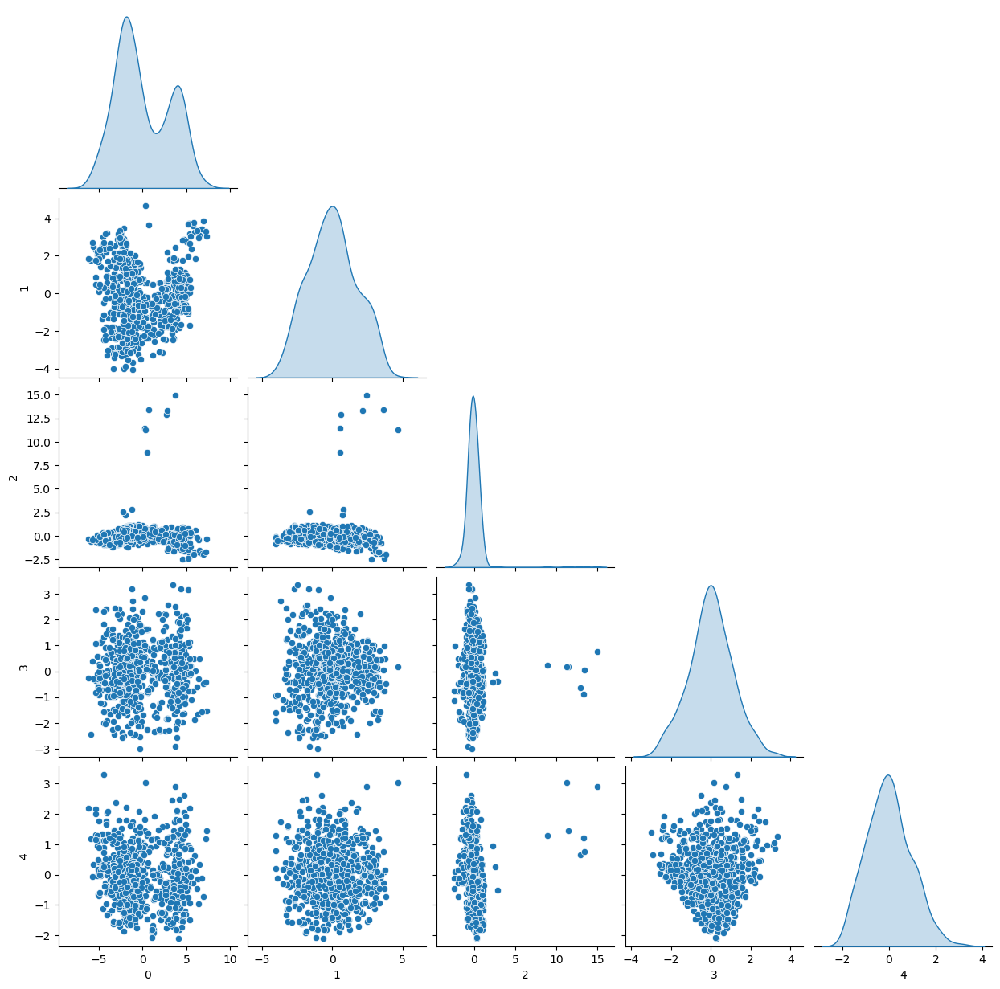

In [90]:
# Plot the resulting pairplot from reduced data
sns.pairplot(pd.DataFrame(pca1_data), diag_kind = 'kde', corner = True);

### G. Train SVM model on components selected from above step.

In [91]:
# Building a Support Vector Machine on data from above step
svc2 = SVC()

# Fit the training data
svc2.fit(pca1_data, y_train)

# check the accuracy on the training set
print("Training accuracy is: ",svc2.score(pca1_data, y_train))

Training accuracy is:  0.7973372781065089


### H. Print Classification metrics for train data of above model and share insights.

In [92]:
# Predict classes from training data
svc2_y_pred_train = svc2.predict(pca1_data)

# Print classification report
print("Classification Report - Train Data[with PCA]:")
# Print Classification Report for training data
print(classification_report(y_train, svc2_y_pred_train))

Classification Report - Train Data[with PCA]:
              precision    recall  f1-score   support

         bus       0.82      0.70      0.75       181
         car       0.85      0.87      0.86       339
         van       0.67      0.76      0.71       156

    accuracy                           0.80       676
   macro avg       0.78      0.77      0.78       676
weighted avg       0.80      0.80      0.80       676



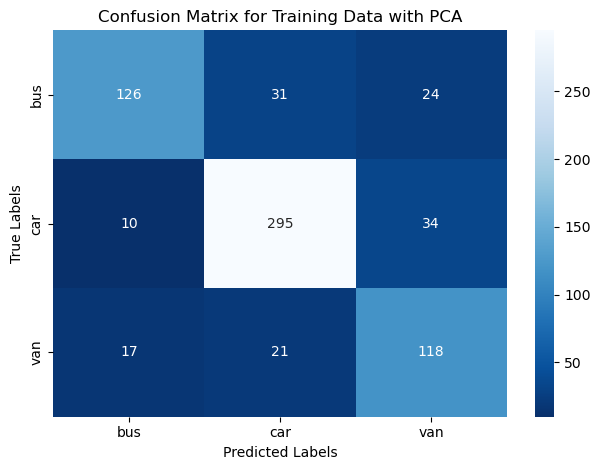

Confusion Matrix for Training Data with PCA:
[[126  31  24]
 [ 10 295  34]
 [ 17  21 118]]


In [93]:
# Generate confusion matrix for the training data
confusion_mat_train = confusion_matrix(y_train, svc2_y_pred_train)

# Create a heatmap
sns.heatmap(confusion_mat_train, annot=True, fmt="d", cmap="Blues_r", xticklabels=['bus','car','van'], yticklabels=['bus','car','van'])

# Set labels, title, and layout
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix for Training Data with PCA")
plt.tight_layout()

# Display the heatmap
plt.show()
print("Confusion Matrix for Training Data with PCA:")
print(confusion_mat_train)

**Insight:**

- **Precision:** Precision measures the accuracy of positive predictions. The precision for the "bus" class is 0.82, for the "car" class is 0.85, and for the "van" class is 0.67. Overall, the model has a relatively high precision for all classes.

- **Recall:** Recall measures the proportion of actual positives that are correctly identified. The recall for the "bus" class is 0.70, for the "car" class is 0.87, and for the "van" class is 0.76. The model performs well in terms of recalling the "car" class, while the "bus" and "van" classes have slightly lower recall rates.

- **F1-score:** The F1-score is the harmonic mean of precision and recall, providing a balanced measure of model performance. The F1-score for the "bus" class is 0.75, for the "car" class is 0.86, and for the "van" class is 0.71. Similar to precision and recall, the "car" class has the highest F1-score, indicating good overall performance.

- **Support:** The support refers to the number of samples of each class in the training data. The "bus" class has 181 samples, the "car" class has 339 samples, and the "van" class has 156 samples.

- **Accuracy:** The overall accuracy of the model on the training data with PCA is 0.80, which means it correctly predicts the class labels for 80% of the samples.

- **Macro Avg:** The macro average calculates the metrics (precision, recall, F1-score) independently for each class and then takes the average. The macro average precision, recall, and F1-score are all around 0.78, indicating a relatively balanced performance across the classes.

- **Weighted Avg:** The weighted average calculates the metrics based on the number of samples in each class, providing a weighted measure of overall performance. The weighted average precision, recall, and F1-score are all around 0.80, which is slightly higher than the macro average due to the larger number of samples in the "car" class.

Looking at the confusion matrix, we can see the actual and predicted class labels. The rows represent the actual classes, while the columns represent the predicted classes. For example, there were 126 instances of the "bus" class that were correctly predicted as "bus," while 31 were incorrectly predicted as "car" and 24 as "van." The matrix provides insights into the model's performance on individual classes and potential areas of misclassification.

Overall, the model trained with PCA achieves a reasonably good performance with an accuracy of 80%. However, there might be room for improvement, especially in correctly classifying the "bus" and "van" classes.

### 4. Performance Improvement:

### A. Train another SVM on the components out of PCA. Tune the parameters to improve performance.

In [94]:
from sklearn.model_selection import GridSearchCV

# Define the SVM classifier
svc2 = SVC()

# Define the parameter grid for tuning
param_grid = {
    'C': [0.1, 1, 10],
    'gamma': [0.1, 0.01, 0.001],
    'kernel': ['rbf', 'linear']
}

# Perform grid search to find the best parameters
grid_search = GridSearchCV(svc2, param_grid, cv=5)
grid_search.fit(pca1_data, y_train)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10], 'gamma': [0.1, 0.01, 0.001],
                         'kernel': ['rbf', 'linear']})

### B. Share best Parameters observed from above step.

In [95]:
# Get the best parameters and the best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_
print("Best Parameters:", best_params)
print("Best Score:", best_score)

# Train the SVM using the best parameters
svc2 = SVC(**best_params)
svc2.fit(pca1_data, y_train)

# Check the accuracy on the training set
train_accuracy = svc2.score(pca1_data, y_train)
print("Training accuracy is: ", train_accuracy)

Best Parameters: {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
Best Score: 0.8002614379084967
Training accuracy is:  0.8875739644970414


### C. Print Classification metrics for train data of above model and share relative improvement in performance in all the models along with insights.

In [96]:
# Predict classes for training data
svc2_y_pred_train = svc2.predict(pca1_data)

# Print classification report for training data
print("Classification Report - Train Data[with PCA]:")
print(classification_report(y_train, svc2_y_pred_train))

Classification Report - Train Data[with PCA]:
              precision    recall  f1-score   support

         bus       0.89      0.86      0.87       181
         car       0.91      0.94      0.92       339
         van       0.84      0.82      0.83       156

    accuracy                           0.89       676
   macro avg       0.88      0.87      0.87       676
weighted avg       0.89      0.89      0.89       676



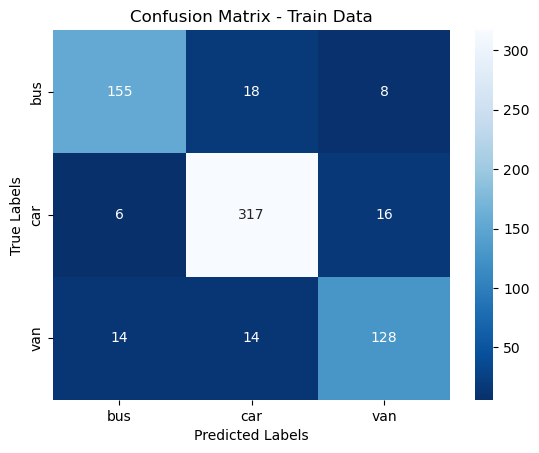

In [97]:
# Get the confusion matrix
cm = confusion_matrix(y_train, svc2_y_pred_train)

# Create a heatmap
sns.heatmap(cm, annot=True, cmap="Blues_r", fmt="d", xticklabels=['bus','car','van'], yticklabels=['bus','car','van'])

# Add labels, title, and axis ticks
plt.title("Confusion Matrix - Train Data")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

**Base SVM Model:**
    
- Accuracy: 0.98
- Overall, the model performs very well with high precision, recall, and F1-score for all classes (bus, car, van).
- The model achieves excellent results without any dimensionality reduction technique.

**SVM Model with PCA:**

- **Accuracy:** 0.80
- After applying Principal Component Analysis (PCA) for dimensionality reduction, the model's performance drops.
- The precision, recall, and F1-score for all classes decrease compared to the base SVM model.
- The model struggles more to correctly classify the "bus" and "van" classes, which have lower precision, recall, and F1-scores.

**Hypertuned SVM Model with PCA:**

- Accuracy: 0.89
- The model is further improved by hyperparameter tuning while using PCA for dimensionality reduction.
- The precision, recall, and F1-score for all classes increase compared to the SVM model with PCA.
- Although the performance is improved, it is still lower than the base SVM model.

**Insights:**

- The base SVM model without dimensionality reduction achieves the highest accuracy and overall performance.
- Dimensionality reduction using PCA can lead to a drop in performance, as observed in the SVM model with PCA.
- Hyperparameter tuning improves the performance of the SVM model with PCA, but it still does not match the performance of the base SVM model.
- The trade-off between dimensionality reduction and model performance should be considered. In this case, the base SVM model without PCA provides the best results.
- It is important to evaluate different models and techniques to determine the most suitable approach for a specific task or dataset.



### 5. Data Understanding & Cleaning: 

### A. Explain pre-requisite/assumptions of PCA.

**Numeric Data:** PCA assumes that the input data consists of numeric variables or features. Categorical or textual data should be preprocessed into numerical representations, such as one-hot encoding or word embeddings, before applying PCA.

**Linear Relationships:** PCA assumes that the relationships between variables are linear. It seeks to find linear combinations of the original variables that capture the maximum amount of variance in the data. If the relationships are non-linear, other dimensionality reduction techniques like kernel PCA may be more appropriate.

**Scale of Variables:** PCA is sensitive to the scale of the variables. It is important to standardize the variables before applying PCA to ensure that no single variable dominates the analysis due to its larger magnitude. Standardization involves subtracting the mean and dividing by the standard deviation of each variable.

**Large Variance Matters:** PCA assumes that variables with larger variances contain more meaningful information and contribute more to the overall structure of the data. Variables with smaller variances are assumed to be less important and might be discarded during dimensionality reduction.

**Independence of Variables:** PCA assumes that the variables are linearly independent of each other. Correlated variables can cause problems in PCA as they might end up being represented by the same principal components, leading to redundant information. It is generally recommended to remove highly correlated variables before applying PCA.

**Normality:** PCA assumes that the variables are normally distributed. While it can be applied to non-normal data, the results might be more reliable if the data approximates a normal distribution. If the variables are significantly non-normal, it may be necessary to use alternative techniques or consider data transformations before applying PCA.

**Homoscedasticity:** PCA assumes that the variables have equal variances across all levels of the independent variables. In the presence of heteroscedasticity (unequal variances), the variables with larger variances may dominate the analysis.

It's important to note that while these assumptions provide general guidelines for applying PCA, they might not always hold in practice. It's advisable to assess the validity of these assumptions based on the specific characteristics of the dataset and consider alternative techniques if the assumptions are violated.

### B. Explain advantages and limitations of PCA.

Principal Component Analysis (PCA) is a popular dimensionality reduction technique used in various fields, including statistics, machine learning, and data analysis. PCA transforms high-dimensional data into a lower-dimensional space while retaining the most important information. It achieves this by identifying orthogonal axes, called principal components, along which the data exhibits the maximum variance.

**Advantages of PCA:**

**Dimensionality Reduction:** One of the main advantages of PCA is its ability to reduce the dimensionality of high-dimensional data. It identifies a smaller set of variables, the principal components, that capture the most significant variability in the original data. This reduction simplifies the subsequent analysis, visualization, and modeling tasks, as it reduces computational complexity and mitigates the curse of dimensionality.

**Feature Extraction:** PCA enables the extraction of underlying patterns or features from a dataset. By projecting the data onto the principal components, which are linear combinations of the original variables, PCA uncovers the relationships and dependencies between variables. This feature extraction can be useful for understanding the underlying structure of the data and identifying important variables for further analysis.

**Data Visualization:** PCA facilitates data visualization by reducing the dimensionality of the data to two or three dimensions. It transforms the data into a new coordinate system based on the principal components, which allows for easier visualization of patterns and relationships. This visualization can aid in exploratory data analysis, clustering, and identifying outliers.

**Noise Reduction:** PCA can help in reducing the impact of noise in the data. Since the principal components capture the most significant variability, they are less influenced by noise or random fluctuations. By eliminating the components with low variance, PCA can filter out noise and enhance the signal-to-noise ratio.

**Limitations of PCA:**

**Linearity Assumption:** PCA assumes that the underlying relationships in the data are linear. It operates by finding linear combinations of the original variables. Therefore, if the relationships in the data are nonlinear, PCA may not be the most suitable technique. Nonlinear relationships may require other dimensionality reduction methods, such as kernel PCA.

**Information Loss:** Although PCA reduces the dimensionality of the data, it comes at the cost of information loss. The lower-dimensional representation of the data does not preserve all the details present in the original dataset. The amount of information loss depends on the number of components retained and the explained variance. It is crucial to balance dimensionality reduction with the retention of critical information.

**Interpretability of Components:** While PCA provides a compact representation of the data, the interpretation of the principal components may not always be straightforward. The components are linear combinations of the original variables, and their meaning is not always readily interpretable. The interpretation becomes more challenging as the dimensionality of the data increases.

**Sensitivity to Outliers:** PCA is sensitive to outliers in the data. Outliers can significantly affect the estimation of the principal components and, consequently, the transformed representation of the data. Outliers with extreme values may dominate the variance, leading to misleading results. Therefore, it is important to preprocess the data and handle outliers appropriately before applying PCA.

Overall, PCA is a valuable tool for dimensionality reduction, feature extraction, and data visualization. However, it is essential to be aware of its assumptions and limitations while applying it to real-world datasets.